
#### Name: Rahaf Abu Hara
#### ID  : z8b9k4


# Demonstration of The Implemented Filters

In this Assignment, the Bilateral Filter, Joint Bilateral Filter, Joint Bilateral Upsampling Filter, and Iterative Upsampling method were implemented. Since we are using convolution in the implementation, one problem that arises is how to convolve the boundaries. 
For that, I used the OpenCV copyMakeBorder function which copies the input image onto another slightly larger image and then automatically pads the boundary by a constant value=0. This way the convolution can be performed over the pixels at the edges, then the extra padding is cut after the operation is done.

(-0.5, 1389.5, 1109.5, -0.5)

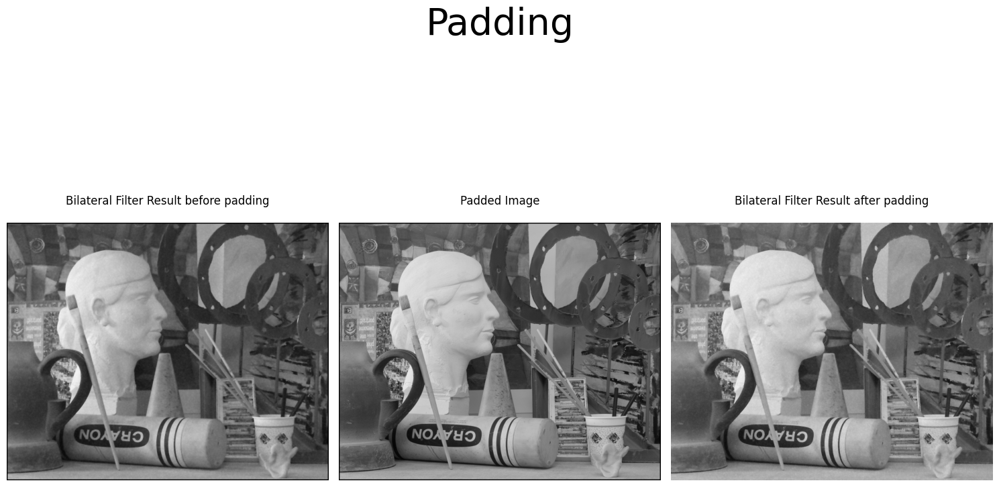

In [8]:
## Padding the image
import matplotlib.pyplot as plt
import cv2

rbp=cv2.imread("/home/rahaf/Desktop/BilateralFilter.png")
pi=cv2.imread("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/padded.png")
rap=cv2.imread("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/BilateralFilter.png")

plt.suptitle("Padding",fontsize=40)

plt.rcParams["figure.figsize"] = [15,10]
plt.rcParams["figure.autolayout"] =     True

plt.subplot(1, 3, 1).set_title("Bilateral Filter Result before padding",pad=20)
plt.imshow(rbp)
plt.axis("off")

plt.subplot(1, 3, 2).set_title( 'Padded Image',pad=20)
plt.imshow(pi)
plt.axis("off")

plt.subplot(1, 3,3).set_title( "Bilateral Filter Result after padding",pad=20)
plt.imshow(rap)
plt.axis("off")


In [23]:
from re import T
import matplotlib.pyplot as plt
import cv2
def display(gt,noise_gt,depth,down,BF,JB,JBU,IU,dataset,sg,ss,w):
    gt=cv2.imread(gt,0)
    noise_gt=cv2.imread(noise_gt,0)
    depth=cv2.imread(depth,0)
    down=cv2.imread(down,0)
    BF=cv2.imread(BF,0)
    JB=cv2.imread(JB)
    JBU=cv2.imread(JBU,0)
    IU=cv2.imread(IU,0)


    # setup the figure
    plt.suptitle("Filters applied on {} dataset with σspatial={}, σspectral={}, w={} ".format(dataset,sg,ss,w),fontsize=80,y=1)


 
    plt.rcParams["figure.figsize"] = [50,100]
    plt.rcParams["figure.autolayout"] =     True
    
    plt.subplot(4, 3, 1).set_title("Ground Truth",fontsize=40,pad=30)
    plt.imshow(gt, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(4, 3, 2).set_title("Ground Truth with Gaussian noise",fontsize=40,pad=30)
    plt.imshow(noise_gt, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(4, 3, 3).set_title("Bilateral Filter",fontsize=40,pad=30)
    plt.imshow(BF, cmap = plt.cm.gray)
    plt.axis("off")


    plt.subplot(4, 3, 4).set_title("RGB Image",fontsize=40,pad=30)
    plt.imshow(gt, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(4, 3, 5).set_title("Color-Disparity Image",fontsize=40,pad=30)
    plt.imshow(depth, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(4, 3, 6).set_title("Joint Bilateral Filter",fontsize=40,pad=30)
    plt.imshow(JB, cmap = plt.cm.gray)
    plt.axis("off")


    plt.subplot(4, 3, 7).set_title("High-Resolutioon Image",fontsize=40,pad=30)
    plt.imshow(gt, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(4, 3, 8).set_title("Low-Resolutioon Image",fontsize=40,pad=30)
    plt.imshow(down, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(4, 3, 9).set_title("Joint Bilateral Upsampling Filter",fontsize=40,pad=30)
    plt.imshow(JBU, cmap = plt.cm.gray)
    plt.axis("off")


    plt.subplot(4, 3, 10).set_title("High-Resolutioon Image",fontsize=40,pad=30)
    plt.imshow(gt, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(4, 3, 11).set_title("Low-Resolutioon Image",fontsize=40,pad=30)
    plt.imshow(down, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(4, 3, 12).set_title("Iterative Upsampling Algorithm",fontsize=40,pad=30)
    plt.imshow(IU, cmap = plt.cm.gray)
    plt.axis("off")



    plt.show()


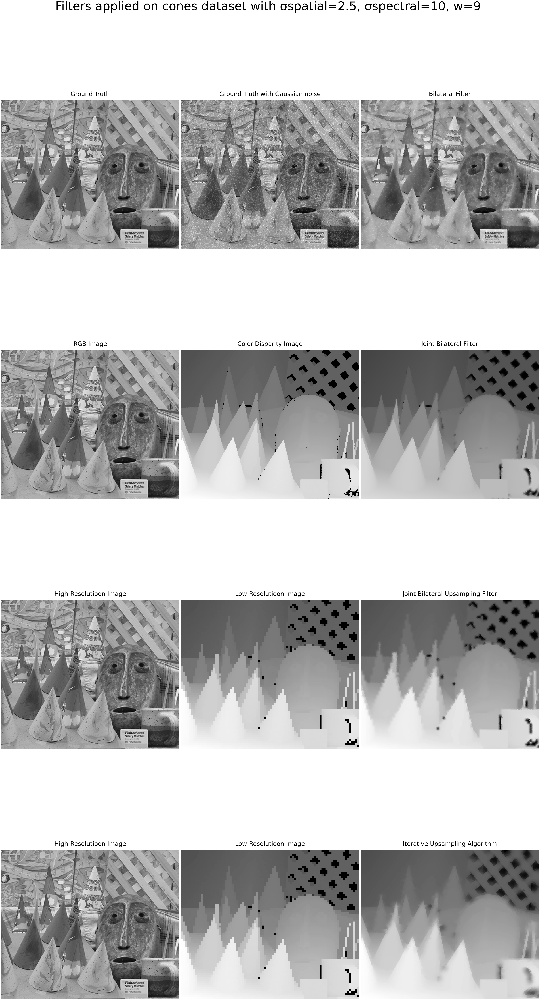

In [24]:
## Demonstration of The Impelemented Filters on cones Dataset
display('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/im2.ppm','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/noisy.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/disp2.pgm','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/low_res.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/BilateralFilter.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/JointBilateralFilter.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IterativeUpsample.png','cones',2.5,10,9)

# Similarity Metrics computation

In the implemented filters, there are two parameters, sigma spatial and sigma spectral that controls the fall-off of weights in spatial and intensity ranges, respectively. Another parameter during the running of the bilateral filter is the window size of how many pixels should be computed on time. The window size is related to the spatial Gaussian. Basically, window size should be around 2 to 3 times e standard deviation of the Gaussian, to include most of the bell values. As the range parameter (σ spectral) increases, the bilateral filter gradually approximates Gaussian convolution more closely, And increasing the spatial parameter (σs) smooths larger features.
As soon as either of the sigmas reaches values near zero, no smoothing occurs. 


In this section, you will find a comparison between the output of the Iterative upsampling and the Joint Bilateral upsampling with the Groundtruth, using different window sizes which means different values of spatial sigma and with different values of sigma range.
As seen in the below Plots that increasing window size (sigma spatial) decreases the values of the SSIM and NCC and increases MSE which means the estimation is deteriorating. Since the image is becoming more blurred, take into consideration that increasing the spatial sigma will not blur an edge as long as the range sigma is smaller than the edge amplitude.



##### MSE, NCC, and SSIM values are computed on the 12 datasets using different window size values and sigma spectral =30, and then plotted as box plots.

In [1]:
import numpy as np
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import mean_squared_error

import cv2
def metrics(dataset,img_gt, img_sol):
    MSE=[dataset]
    ssim1=[dataset]
    ncc=[dataset]
    img_gt=cv2.imread(img_gt)
    img_gt=cv2.cvtColor(img_gt, cv2.COLOR_BGR2GRAY)
 
    for i in img_sol :
        i=cv2.imread(i)
        i=cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)

        """ Compute NCC ,MSE and SSIM """
        ssim1.append(ssim(img_gt, i))
        ncc.append(cv2.matchTemplate(img_gt,i,cv2.TM_CCORR_NORMED)[0])
        MSE.append(mean_squared_error(img_gt, i, squared=False))
        
        
    return MSE,ssim1,ncc
    



In [2]:
#### MSE,NCC,SIIM when window size =9
MSE=np.zeros((12,3), dtype=object)
SSIM=np.zeros((12,3), dtype=object)
NCC=np.zeros((12,3), dtype=object)

# ## Art
MSE[0,:],SSIM[0,:],NCC[0,:]=metrics(0,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## Baby
MSE[1,:],SSIM[1,:],NCC[1,:]=metrics(1,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## Flower pots
MSE[2,:],SSIM[2,:],NCC[2,:]=metrics(2,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## Books 
MSE[3,:],SSIM[3,:],NCC[3,:]=metrics(3,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## Dolls
MSE[4,:],SSIM[4,:],NCC[4,:]=metrics(4,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## Moebius
MSE[5,:],SSIM[5,:],NCC[5,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## Aloe
MSE[6,:],SSIM[6,:],NCC[6,:]=metrics(6,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## Bowling2
MSE[7,:],SSIM[7,:],NCC[7,:]=metrics(7,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## cones
MSE[8,:],SSIM[8,:],NCC[8,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## Laundry
MSE[9,:],SSIM[9,:],NCC[9,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## Reindeer
MSE[10,:],SSIM[10,:],NCC[10,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])
# ## teddy
MSE[11,:],SSIM[11,:],NCC[11,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/IUComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/jbuComparisons_window_size_9.000000_spectral_sigma_30.000000.PNG"])

#### MSE_15,NCC_15,SIIM when window size =15
MSE_15=np.zeros((12,3), dtype=object)
SSIM_15=np.zeros((12,3), dtype=object)
NCC_15=np.zeros((12,3), dtype=object)

# ## Art
MSE_15[0,:],SSIM_15[0,:],NCC_15[0,:]=metrics(0,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## Baby
MSE_15[1,:],SSIM_15[1,:],NCC_15[1,:]=metrics(1,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## Flower pots
MSE_15[2,:],SSIM_15[2,:],NCC_15[2,:]=metrics(2,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## Books 
MSE_15[3,:],SSIM_15[3,:],NCC_15[3,:]=metrics(3,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## Dolls
MSE_15[4,:],SSIM_15[4,:],NCC_15[4,:]=metrics(4,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## Moebius
MSE_15[5,:],SSIM_15[5,:],NCC_15[5,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## Aloe
MSE_15[6,:],SSIM_15[6,:],NCC_15[6,:]=metrics(6,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## Bowling2
MSE_15[7,:],SSIM_15[7,:],NCC_15[7,:]=metrics(7,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## cones
MSE_15[8,:],SSIM_15[8,:],NCC_15[8,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## Laundry
MSE_15[9,:],SSIM_15[9,:],NCC_15[9,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## Reindeer
MSE_15[10,:],SSIM_15[10,:],NCC_15[10,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])
# ## teddy
MSE_15[11,:],SSIM_15[11,:],NCC_15[11,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/IUComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/jbuComparisons_window_size_15.000000_spectral_sigma_30.000000.PNG"])

#### MSE_21,NCC_21,SIIM when window size =21
MSE_21=np.zeros((12,3), dtype=object)
SSIM_21=np.zeros((12,3), dtype=object)
NCC_21=np.zeros((12,3), dtype=object)

# ## Art
MSE_21[0,:],SSIM_21[0,:],NCC_21[0,:]=metrics(0,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## Baby
MSE_21[1,:],SSIM_21[1,:],NCC_21[1,:]=metrics(1,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## Flower pots
MSE_21[2,:],SSIM_21[2,:],NCC_21[2,:]=metrics(2,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## Books 
MSE_21[3,:],SSIM_21[3,:],NCC_21[3,:]=metrics(3,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## Dolls
MSE_21[4,:],SSIM_21[4,:],NCC_21[4,:]=metrics(4,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## Moebius
MSE_21[5,:],SSIM_21[5,:],NCC_21[5,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## Aloe
MSE_21[6,:],SSIM_21[6,:],NCC_21[6,:]=metrics(6,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## Bowling2
MSE_21[7,:],SSIM_21[7,:],NCC_21[7,:]=metrics(7,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## cones
MSE_21[8,:],SSIM_21[8,:],NCC_21[8,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## Laundry
MSE_21[9,:],SSIM_21[9,:],NCC_21[9,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## Reindeer
MSE_21[10,:],SSIM_21[10,:],NCC_21[10,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])
# ## teddy
MSE_21[11,:],SSIM_21[11,:],NCC_21[11,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/IUComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/jbuComparisons_window_size_21.000000_spectral_sigma_30.000000.PNG"])

#### MSE_28,NCC_28,SIIM when window size =28
MSE_28=np.zeros((12,3), dtype=object)
SSIM_28=np.zeros((12,3), dtype=object)
NCC_28=np.zeros((12,3), dtype=object)

# ## Art
MSE_28[0,:],SSIM_28[0,:],NCC_28[0,:]=metrics(0,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## Baby
MSE_28[1,:],SSIM_28[1,:],NCC_28[1,:]=metrics(1,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## Flower pots
MSE_28[2,:],SSIM_28[2,:],NCC_28[2,:]=metrics(2,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## Books 
MSE_28[3,:],SSIM_28[3,:],NCC_28[3,:]=metrics(3,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## Dolls
MSE_28[4,:],SSIM_28[4,:],NCC_28[4,:]=metrics(4,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## Moebius
MSE_28[5,:],SSIM_28[5,:],NCC_28[5,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## Aloe
MSE_28[6,:],SSIM_28[6,:],NCC_28[6,:]=metrics(6,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## Bowling2
MSE_28[7,:],SSIM_28[7,:],NCC_28[7,:]=metrics(7,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## cones
MSE_28[8,:],SSIM_28[8,:],NCC_28[8,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## Laundry
MSE_28[9,:],SSIM_28[9,:],NCC_28[9,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## Reindeer
MSE_28[10,:],SSIM_28[10,:],NCC_28[10,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])
# ## teddy
MSE_28[11,:],SSIM_28[11,:],NCC_28[11,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/IUComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/jbuComparisons_window_size_28.000000_spectral_sigma_30.000000.PNG"])



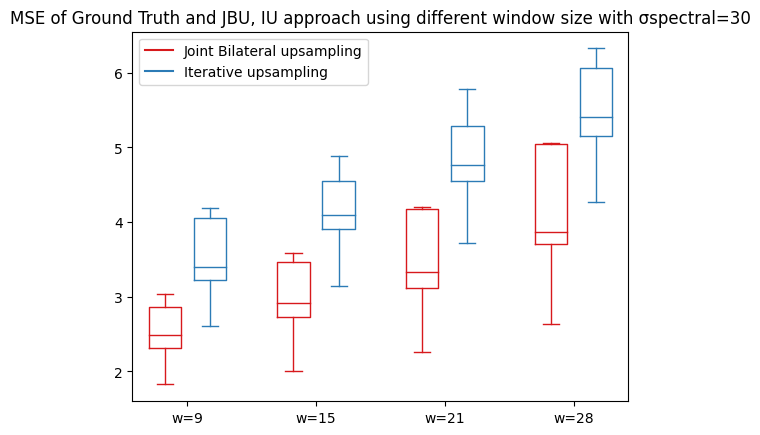

In [25]:
#@title MSE of Ground Truth and JBU approach using different window size with σspectral=30

# Import libraries
import matplotlib.pyplot as plt
import numpy as np
# Creating dataset
np.random.seed(10)
data_1 = MSE[:,2]
data_2 = MSE_15[:,2]
data_3 =MSE_21[:,2]
data_4 =MSE_28[:,2]
data = [data_1, data_2, data_3,data_4]



data_1_iu = MSE[:,1]
data_2_iu = MSE_15[:,1]
data_3_iu =MSE_21[:,1]
data_4_iu=MSE_28[:,1]
data_iu = [data_1_iu, data_2_iu, data_3_iu,data_4_iu]

w=["w=9","w=15","w=21","w=28"]

jbu_plot=plt.boxplot(data,positions=np.array(np.arange(len(data)))*2.0-0.35, showfliers=False)
iu_plot=plt.boxplot(data_iu,positions=np.array(np.arange(len(data_iu)))*2.0+0.35, showfliers=False)

def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
    plt.plot([], c=color_code, label=label)
    plt.legend()

define_box_properties(jbu_plot, '#D7191C', 'Joint Bilateral upsampling')
define_box_properties(iu_plot, '#2C7BB6', 'Iterative upsampling')

plt.xticks(np.arange(0, len(w) * 2, 2),w)
plt.title("MSE of Ground Truth and JBU, IU approach using different window size with σspectral=30")

 
# show plot
plt.show()




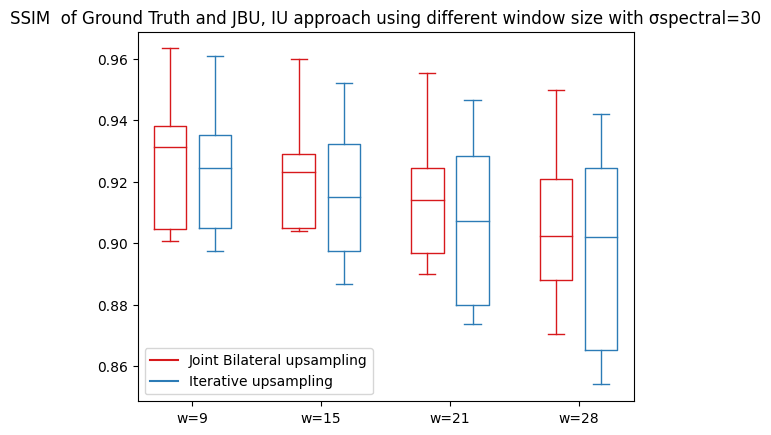

In [26]:
# Import libraries
import matplotlib.pyplot as plt
import numpy as np
# Creating dataset
np.random.seed(10)
data_1 = SSIM[:,2]
data_2 = SSIM_15[:,2]
data_3 =SSIM_21[:,2]
data_4=SSIM_28[:,2]
data = [data_1, data_2, data_3,data_4]



data_1_iu = SSIM[:,1]
data_2_iu = SSIM_15[:,1]
data_3_iu =SSIM_21[:,1]
data_4_iu=SSIM_28[:,1]
data_iu = [data_1_iu, data_2_iu, data_3_iu,data_4_iu]
w=["w=9","w=15","w=21","w=28"]

jbu_plot=plt.boxplot(data,positions=np.array(np.arange(len(data)))*2.0-0.35, showfliers=False)
iu_plot=plt.boxplot(data_iu,positions=np.array(np.arange(len(data_iu)))*2.0+0.35, showfliers=False)

def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
    plt.plot([], c=color_code, label=label)
    plt.legend()

define_box_properties(jbu_plot, '#D7191C', 'Joint Bilateral upsampling')
define_box_properties(iu_plot, '#2C7BB6', 'Iterative upsampling')

plt.xticks(np.arange(0, len(w) * 2, 2),w)

plt.title("SSIM  of Ground Truth and JBU, IU approach using different window size with σspectral=30")

 
# show plot
plt.show()


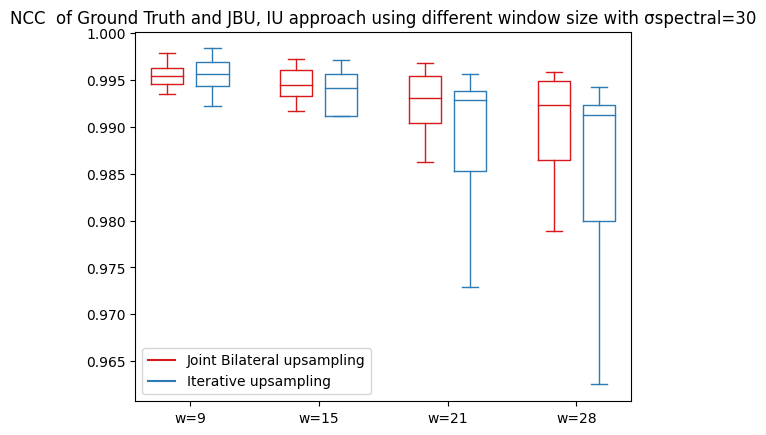

In [27]:
# Import libraries
import matplotlib.pyplot as plt
import numpy as np
# Creating dataset
np.random.seed(10)
data_1 = NCC[:,2]
data_2 = NCC_15[:,2]
data_3 =NCC_21[:,2]
data_4=NCC_28[:,2]
data = [data_1, data_2, data_3,data_4]



data_1_iu = NCC[:,1]
data_2_iu =NCC_15[:,1]
data_3_iu=NCC_21[:,1]
data_4_iu=NCC_28[:,1]
data_iu = [data_1_iu, data_2_iu, data_3_iu,data_4_iu]

w=["w=9","w=15","w=21","w=28"]

jbu_plot=plt.boxplot(data,positions=np.array(np.arange(len(data)))*2.0-0.35, showfliers=False)
iu_plot=plt.boxplot(data_iu,positions=np.array(np.arange(len(data_iu)))*2.0+0.35, showfliers=False)

def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
    plt.plot([], c=color_code, label=label)
    plt.legend()

define_box_properties(jbu_plot, '#D7191C', 'Joint Bilateral upsampling')
define_box_properties(iu_plot, '#2C7BB6', 'Iterative upsampling')

plt.xticks(np.arange(0, len(w) * 2, 2),w)

plt.title("NCC  of Ground Truth and JBU, IU approach using different window size with σspectral=30")

 
# show plot
plt.show()

##### MSE, NCC, and SIIM values are computed on the 12 datasets using different sigma spectral values and sigma spatial= 2.5 and then plotted as box plots.

As seen in the below Plots that increasing sigma spectral decreases the values of the SSIM and NCC and increases MSE which means the estimation is deteriorating.

In [9]:
#### MSE_sigma,NCC_sigma,SIIM when sigma spectral =1
MSE_sigma=np.zeros((12,3), dtype=object)
SSIM_sigma=np.zeros((12,3), dtype=object)
NCC_sigma=np.zeros((12,3), dtype=object)

# ## Art
MSE_sigma[0,:],SSIM_sigma[0,:],NCC_sigma[0,:]=metrics(0,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## Baby
MSE_sigma[1,:],SSIM_sigma[1,:],NCC_sigma[1,:]=metrics(1,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## Flower pots
MSE_sigma[2,:],SSIM_sigma[2,:],NCC_sigma[2,:]=metrics(2,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## Books 
MSE_sigma[3,:],SSIM_sigma[3,:],NCC_sigma[3,:]=metrics(3,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## Dolls
MSE_sigma[4,:],SSIM_sigma[4,:],NCC_sigma[4,:]=metrics(4,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## Moebius
MSE_sigma[5,:],SSIM_sigma[5,:],NCC_sigma[5,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## Aloe
MSE_sigma[6,:],SSIM_sigma[6,:],NCC_sigma[6,:]=metrics(6,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## Bowling2
MSE_sigma[7,:],SSIM_sigma[7,:],NCC_sigma[7,:]=metrics(7,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## cones
MSE_sigma[8,:],SSIM_sigma[8,:],NCC_sigma[8,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## Laundry
MSE_sigma[9,:],SSIM_sigma[9,:],NCC_sigma[9,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## Reindeer
MSE_sigma[10,:],SSIM_sigma[10,:],NCC_sigma[10,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])
# ## teddy
MSE_sigma[11,:],SSIM_sigma[11,:],NCC_sigma[11,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/jbuComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG"])


#### MSE_sigma_10,NCC_sigma_10,SIIM when sigma=10
MSE_sigma_10=np.zeros((12,3), dtype=object)
SSIM_sigma_10=np.zeros((12,3), dtype=object)
NCC_sigma_10=np.zeros((12,3), dtype=object)

# ## Art
MSE_sigma_10[0,:],SSIM_sigma_10[0,:],NCC_sigma_10[0,:]=metrics(0,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## Baby
MSE_sigma_10[1,:],SSIM_sigma_10[1,:],NCC_sigma_10[1,:]=metrics(1,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## Flower pots
MSE_sigma_10[2,:],SSIM_sigma_10[2,:],NCC_sigma_10[2,:]=metrics(2,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## Books 
MSE_sigma_10[3,:],SSIM_sigma_10[3,:],NCC_sigma_10[3,:]=metrics(3,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## Dolls
MSE_sigma_10[4,:],SSIM_sigma_10[4,:],NCC_sigma_10[4,:]=metrics(4,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## Moebius
MSE_sigma_10[5,:],SSIM_sigma_10[5,:],NCC_sigma_10[5,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## Aloe
MSE_sigma_10[6,:],SSIM_sigma_10[6,:],NCC_sigma_10[6,:]=metrics(6,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## Bowling2
MSE_sigma_10[7,:],SSIM_sigma_10[7,:],NCC_sigma_10[7,:]=metrics(7,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## cones
MSE_sigma_10[8,:],SSIM_sigma_10[8,:],NCC_sigma_10[8,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## Laundry
MSE_sigma_10[9,:],SSIM_sigma_10[9,:],NCC_sigma_10[9,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## Reindeer
MSE_sigma_10[10,:],SSIM_sigma_10[10,:],NCC_sigma_10[10,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])
# ## teddy
MSE_sigma_10[11,:],SSIM_sigma_10[11,:],NCC_sigma_10[11,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/IUComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/jbuComparisons_window_size_9.000000_spectral_sigma_10.000000.PNG"])


#### MSE_sigma_20,NCC_sigma_20,SIIM when sigma =20
MSE_sigma_20=np.zeros((12,3), dtype=object)
SSIM_sigma_20=np.zeros((12,3), dtype=object)
NCC_sigma_20=np.zeros((12,3), dtype=object)

# ## Art
MSE_sigma_20[0,:],SSIM_sigma_20[0,:],NCC_sigma_20[0,:]=metrics(0,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## Baby
MSE_sigma_20[1,:],SSIM_sigma_20[1,:],NCC_sigma_20[1,:]=metrics(1,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## Flower pots
MSE_sigma_20[2,:],SSIM_sigma_20[2,:],NCC_sigma_20[2,:]=metrics(2,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## Books 
MSE_sigma_20[3,:],SSIM_sigma_20[3,:],NCC_sigma_20[3,:]=metrics(3,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## Dolls
MSE_sigma_20[4,:],SSIM_sigma_20[4,:],NCC_sigma_20[4,:]=metrics(4,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## Moebius
MSE_sigma_20[5,:],SSIM_sigma_20[5,:],NCC_sigma_20[5,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## Aloe
MSE_sigma_20[6,:],SSIM_sigma_20[6,:],NCC_sigma_20[6,:]=metrics(6,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## Bowling2
MSE_sigma_20[7,:],SSIM_sigma_20[7,:],NCC_sigma_20[7,:]=metrics(7,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## cones
MSE_sigma_20[8,:],SSIM_sigma_20[8,:],NCC_sigma_20[8,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## Laundry
MSE_sigma_20[9,:],SSIM_sigma_20[9,:],NCC_sigma_20[9,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## Reindeer
MSE_sigma_20[10,:],SSIM_sigma_20[10,:],NCC_sigma_20[10,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])
# ## teddy
MSE_sigma_20[11,:],SSIM_sigma_20[11,:],NCC_sigma_20[11,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/IUComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/jbuComparisons_window_size_9.000000_spectral_sigma_20.000000.PNG"])


#### MSE_sigma_50,NCC_sigma_50,SIIM when sigma =50
MSE_sigma_50=np.zeros((12,3), dtype=object)
SSIM_sigma_50=np.zeros((12,3), dtype=object)
NCC_sigma_50=np.zeros((12,3), dtype=object)

# ## Art
MSE_sigma_50[0,:],SSIM_sigma_50[0,:],NCC_sigma_50[0,:]=metrics(0,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## Baby
MSE_sigma_50[1,:],SSIM_sigma_50[1,:],NCC_sigma_50[1,:]=metrics(1,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## Flower pots
MSE_sigma_50[2,:],SSIM_sigma_50[2,:],NCC_sigma_50[2,:]=metrics(2,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## Books 
MSE_sigma_50[3,:],SSIM_sigma_50[3,:],NCC_sigma_50[3,:]=metrics(3,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## Dolls
MSE_sigma_50[4,:],SSIM_sigma_50[4,:],NCC_sigma_50[4,:]=metrics(4,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## Moebius
MSE_sigma_50[5,:],SSIM_sigma_50[5,:],NCC_sigma_50[5,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## Aloe
MSE_sigma_50[6,:],SSIM_sigma_50[6,:],NCC_sigma_50[6,:]=metrics(6,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## Bowling2
MSE_sigma_50[7,:],SSIM_sigma_50[7,:],NCC_sigma_50[7,:]=metrics(7,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## cones
MSE_sigma_50[8,:],SSIM_sigma_50[8,:],NCC_sigma_50[8,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## Laundry
MSE_sigma_50[9,:],SSIM_sigma_50[9,:],NCC_sigma_50[9,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## Reindeer
MSE_sigma_50[10,:],SSIM_sigma_50[10,:],NCC_sigma_50[10,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])
# ## teddy
MSE_sigma_50[11,:],SSIM_sigma_50[11,:],NCC_sigma_50[11,:]=metrics(5,"/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/im2.ppm",["/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/IUComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG","/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/jbuComparisons_window_size_9.000000_spectral_sigma_50.000000.PNG"])





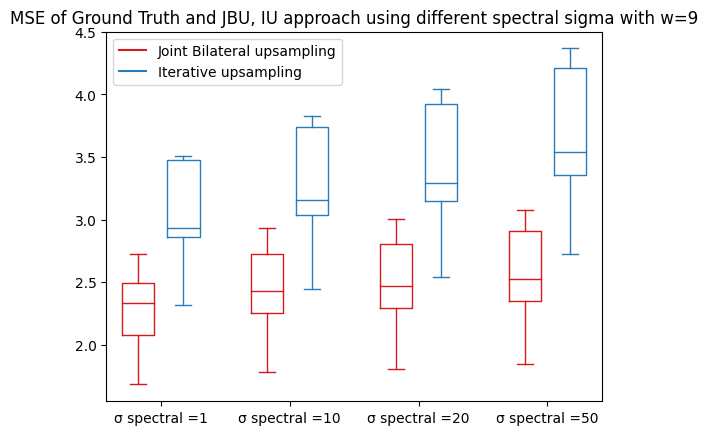

In [30]:

#@title MSE of Ground Truth and JBU approach using different sigma spectral with w=9

# Import libraries
import matplotlib.pyplot as plt
import numpy as np
# Creating dataset
np.random.seed(10)
data_1 = MSE_sigma[:,2]
data_2 = MSE_sigma_10[:,2]
data_3 =MSE_sigma_20[:,2]
data_4 =MSE_sigma_50[:,2]
data = [data_1, data_2, data_3,data_4]



data_1_iu = MSE_sigma[:,1]
data_2_iu = MSE_sigma_10[:,1]
data_3_iu =MSE_sigma_20[:,1]
data_4_iu=MSE_sigma_50[:,1]
data_iu = [data_1_iu, data_2_iu, data_3_iu,data_4_iu]

w=["σ spectral =1","σ spectral =10","σ spectral =20","σ spectral =50"]

jbu_plot=plt.boxplot(data,positions=np.array(np.arange(len(data)))*2.0-0.35, showfliers=False)
iu_plot=plt.boxplot(data_iu,positions=np.array(np.arange(len(data_iu)))*2.0+0.35, showfliers=False)

def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
    plt.plot([], c=color_code, label=label)
    plt.legend()

define_box_properties(jbu_plot, '#D7191C', 'Joint Bilateral upsampling')
define_box_properties(iu_plot, '#2C7BB6', 'Iterative upsampling')

plt.xticks(np.arange(0, len(w) * 2, 2),w)
plt.title("MSE of Ground Truth and JBU, IU approach using different spectral sigma with w=9")

 
# show plot
plt.show()





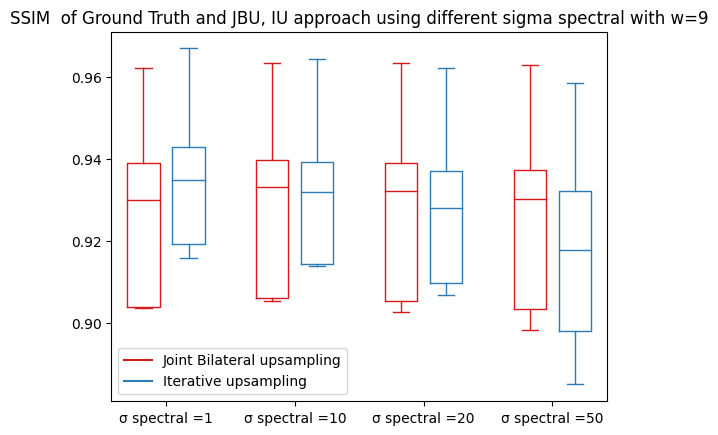

In [31]:
# Import libraries
import matplotlib.pyplot as plt
import numpy as np
# Creating dataset
np.random.seed(10)
data_1 = SSIM_sigma[:,2]
data_2 = SSIM_sigma_10[:,2]
data_3 =SSIM_sigma_20[:,2]
data_4=SSIM_sigma_50[:,2]
data = [data_1, data_2, data_3,data_4]



data_1_iu = SSIM_sigma[:,1]
data_2_iu = SSIM_sigma_10[:,1]
data_3_iu =SSIM_sigma_20[:,1]
data_4_iu=SSIM_sigma_50[:,1]
data_iu = [data_1_iu, data_2_iu, data_3_iu,data_4_iu]
w=["σ spectral =1","σ spectral =10","σ spectral =20","σ spectral =50"]

jbu_plot=plt.boxplot(data,positions=np.array(np.arange(len(data)))*2.0-0.35, showfliers=False)
iu_plot=plt.boxplot(data_iu,positions=np.array(np.arange(len(data_iu)))*2.0+0.35, showfliers=False)

def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
    plt.plot([], c=color_code, label=label)
    plt.legend()

define_box_properties(jbu_plot, '#D7191C', 'Joint Bilateral upsampling')
define_box_properties(iu_plot, '#2C7BB6', 'Iterative upsampling')

plt.xticks(np.arange(0, len(w) * 2, 2),w)

plt.title("SSIM  of Ground Truth and JBU, IU approach using different sigma spectral with w=9")

 
# show plot
plt.show()

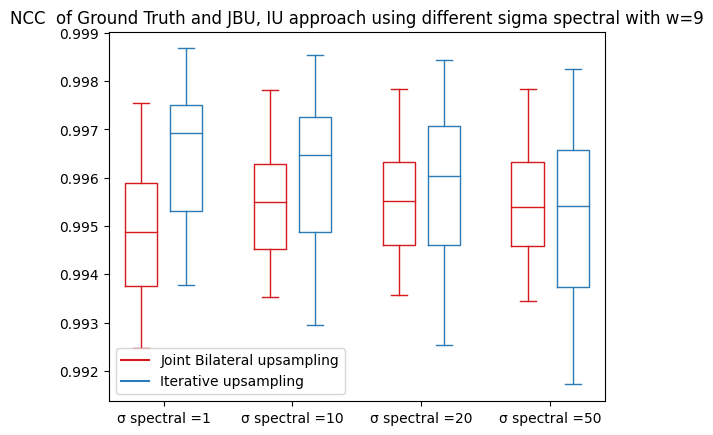

In [28]:
# Import libraries
import matplotlib.pyplot as plt
import numpy as np
# Creating dataset
np.random.seed(10)
data_1 = NCC_sigma[:,2]
data_2 = NCC_sigma_10[:,2]
data_3 =NCC_sigma_20[:,2]
data_4=NCC_sigma_50[:,2]
data = [data_1, data_2, data_3,data_4]

data_1_iu = NCC_sigma[:,1]
data_2_iu =NCC_sigma_10[:,1]
data_3_iu=NCC_sigma_20[:,1]
data_4_iu=NCC_sigma_50[:,1]
data_iu = [data_1_iu, data_2_iu, data_3_iu,data_4_iu]
w=["σ spectral =1","σ spectral =10","σ spectral =20","σ spectral =50"]






jbu_plot=plt.boxplot(data,positions=np.array(np.arange(len(data)))*2.0-0.35, showfliers=False)
iu_plot=plt.boxplot(data_iu,positions=np.array(np.arange(len(data_iu)))*2.0+0.35, showfliers=False)

def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
    plt.plot([], c=color_code, label=label)
    plt.legend()

define_box_properties(jbu_plot, '#D7191C', 'Joint Bilateral upsampling')
define_box_properties(iu_plot, '#2C7BB6', 'Iterative upsampling')

plt.xticks(np.arange(0, len(w) * 2, 2),w)

plt.title("NCC  of Ground Truth and JBU, IU approach using different sigma spectral with w=9")

 
# show plot
plt.show()

# Processing Time computation
It can be duduced from the below figures that increasing window size increases the processing time in both approaches. However Iterative Upsampling approach is still faster than the Joint Bilateral Upsampling at a certain window size. 

In [62]:
## procesiing time for each pair using different sigma spectral  with different algorithm
import pandas as pd
import matplotlib.pyplot as plt

def processing_time(csv_file,weight,dataset,x,fixed,param):
    df = pd.read_csv(csv_file)
    y_n=[((df.loc[df[fixed].isin([weight]) & df['algorithm'].isin(['IterativeUpsampling']) & df[param].isin([i]), 'time(ms)'].values[0])/60000) for i in x]
    y_dp=[((df.loc[df[fixed].isin([weight]) & df['algorithm'].isin(['JointBilateralUpsampling']) & df[param].isin([i]), 'time(ms)'].values[0])/60000) for i in x]
    plt.plot(x, y_n, label = "Iterative Upsampling(IU)", linestyle="-.", marker='o')
    plt.plot(x, y_dp, label = "Joint Bilateral Upsampling(JBU)", linestyle=":", marker='o')
    plt.xlabel(param)
    plt.ylabel('Time (min)')
    plt.title('Processing time of IU and JBU algorithms with different {} on {} datatset using {}={} '.format(param,dataset,fixed,weight))
    plt.legend()
    plt.show()

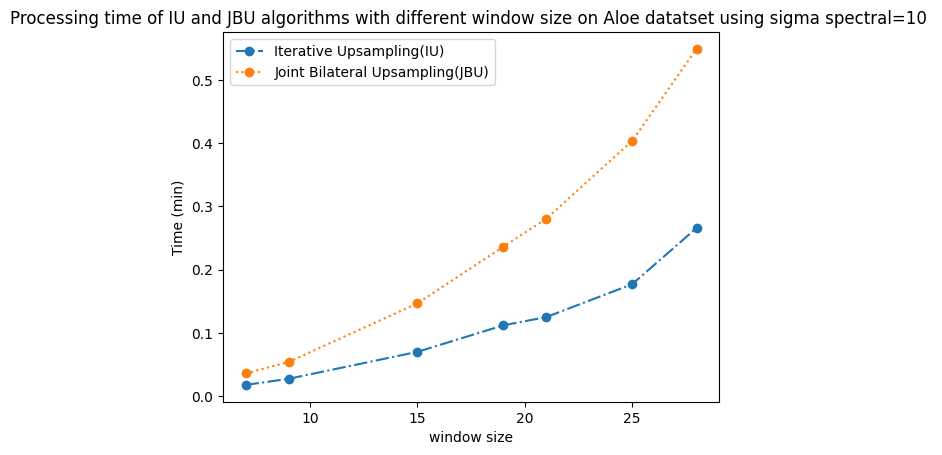

In [63]:
#### Aloe
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/time.csv",10,'Aloe',[7,9,15,19,21,25,28],'sigma spectral','window size')

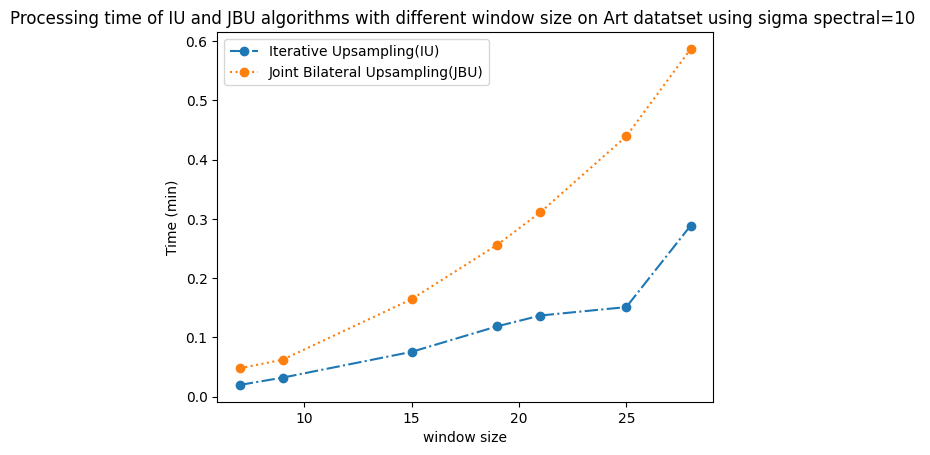

In [64]:
### Art 
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/time.csv",10,'Art',[7,9,15,19,21,25,28],'sigma spectral','window size')


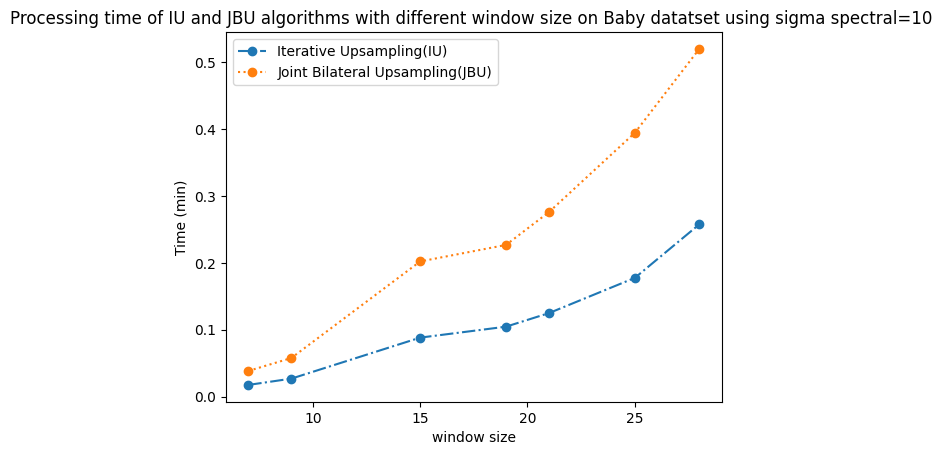

In [65]:
### Baby
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/time.csv",10,'Baby',[7,9,15,19,21,25,28],'sigma spectral','window size')


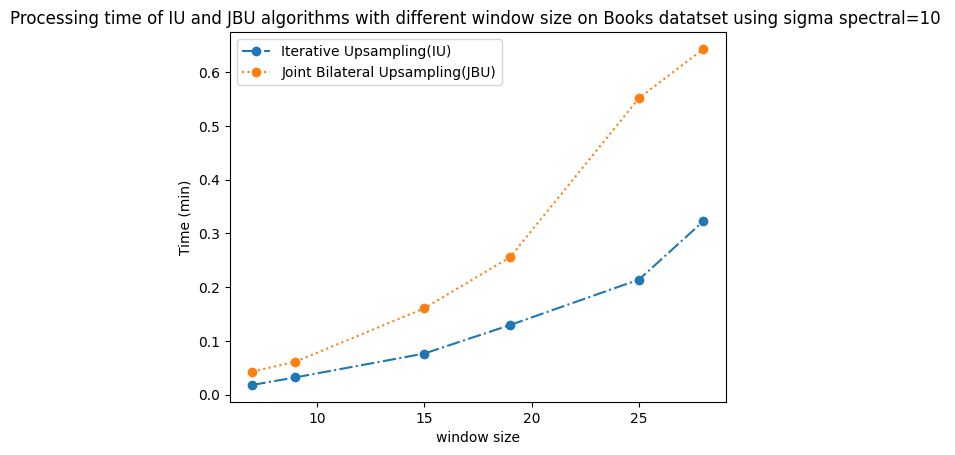

In [66]:
### Books
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/time.csv",10,'Books',[7,9,15,19,25,28],'sigma spectral','window size')

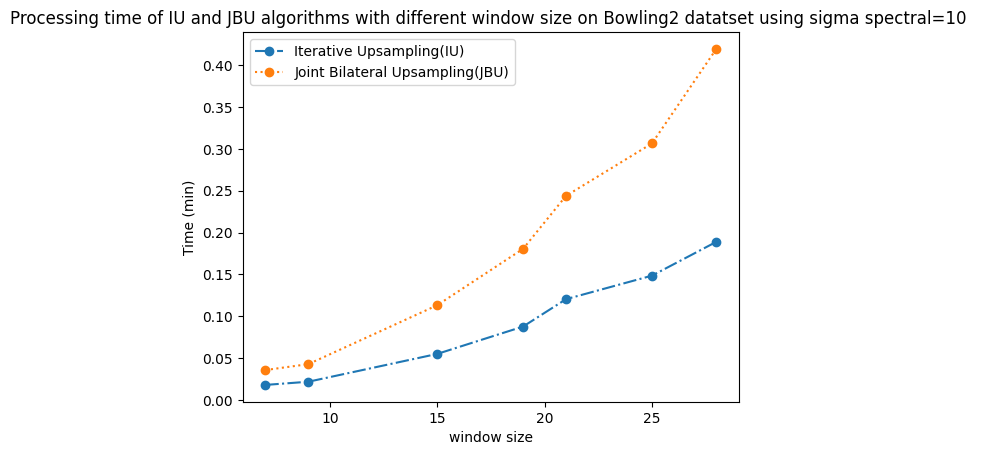

In [67]:
### Bowling2
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/time.csv",10,'Bowling2',[7,9,15,19,21,25,28],'sigma spectral','window size')


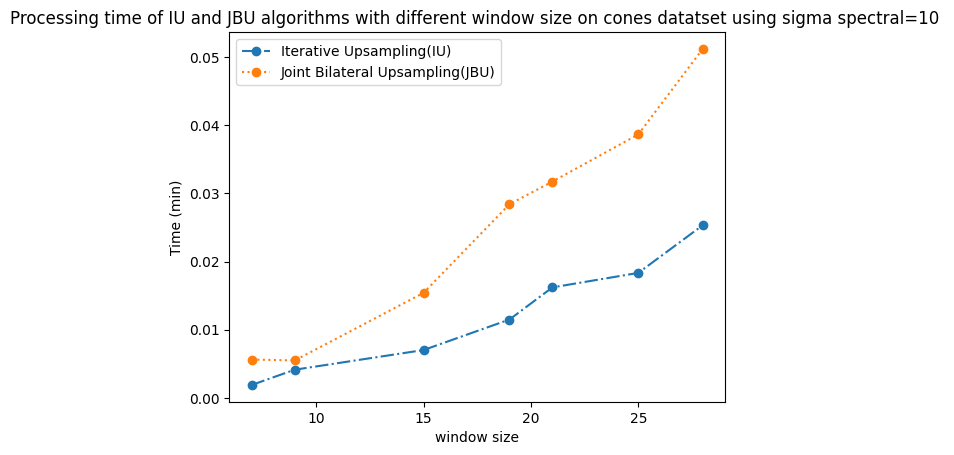

In [68]:
### cones
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/time.csv",10,'cones',[7,9,15,19,21,25,28],'sigma spectral','window size')


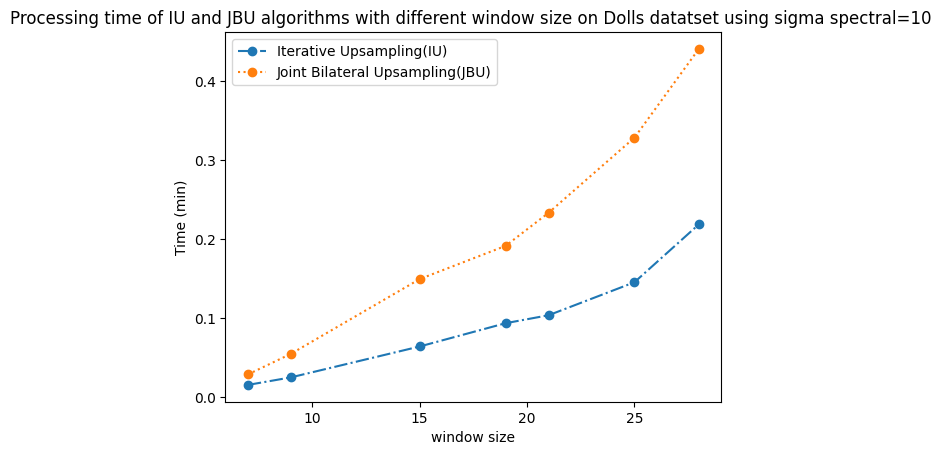

In [69]:
### Dolls
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/time.csv",10,'Dolls',[7,9,15,19,21,25,28],'sigma spectral','window size')

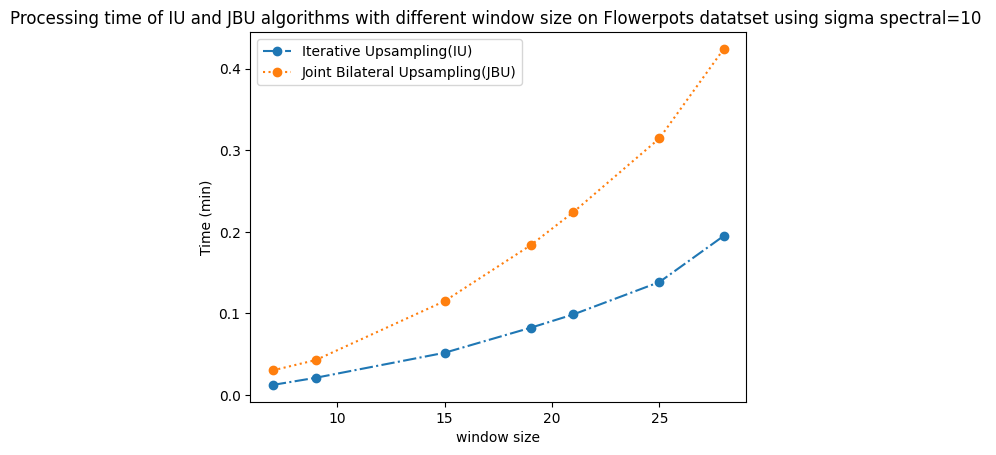

In [70]:
### Flower Pots
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/time.csv",10,'Flowerpots',[7,9,15,19,21,25,28],'sigma spectral','window size')

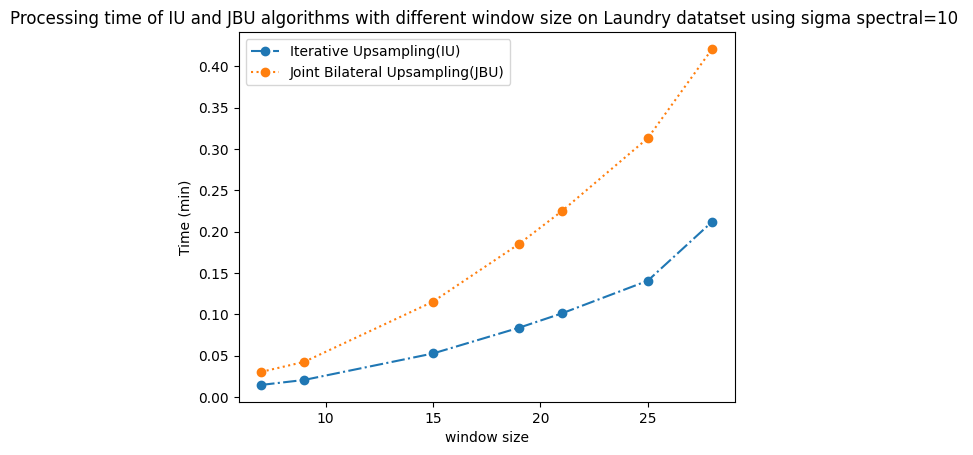

In [71]:
### Laundry
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/time.csv",10,'Laundry',[7,9,15,19,21,25,28],'sigma spectral','window size')


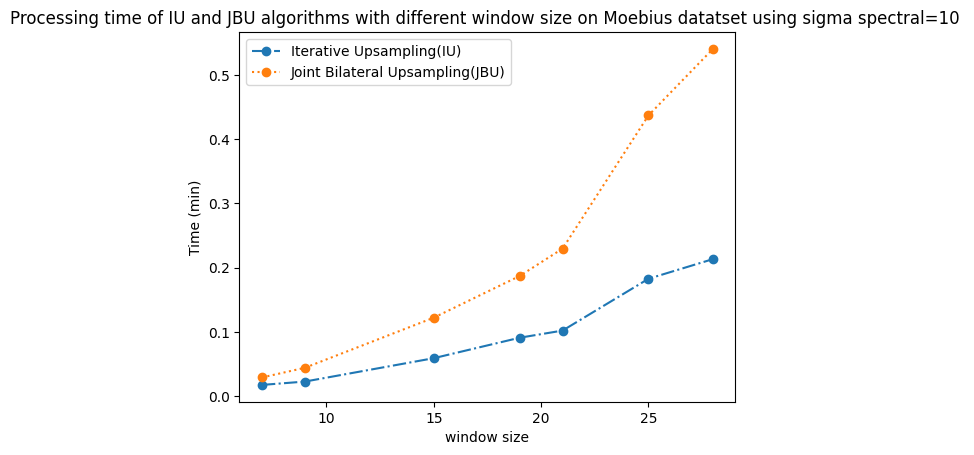

In [72]:
#### Moebius
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/time.csv",10,'Moebius',[7,9,15,19,21,25,28],'sigma spectral','window size')

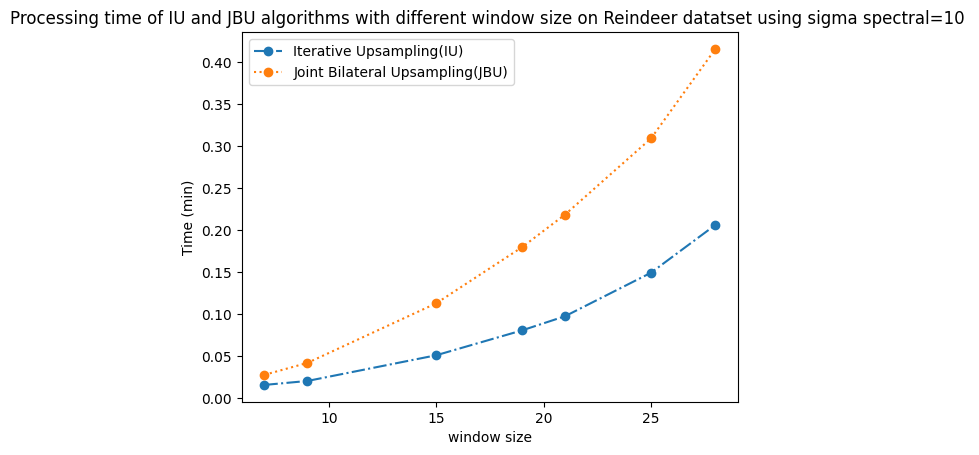

In [73]:
### Reindeer
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/time.csv",10,'Reindeer',[7,9,15,19,21,25,28],'sigma spectral','window size')


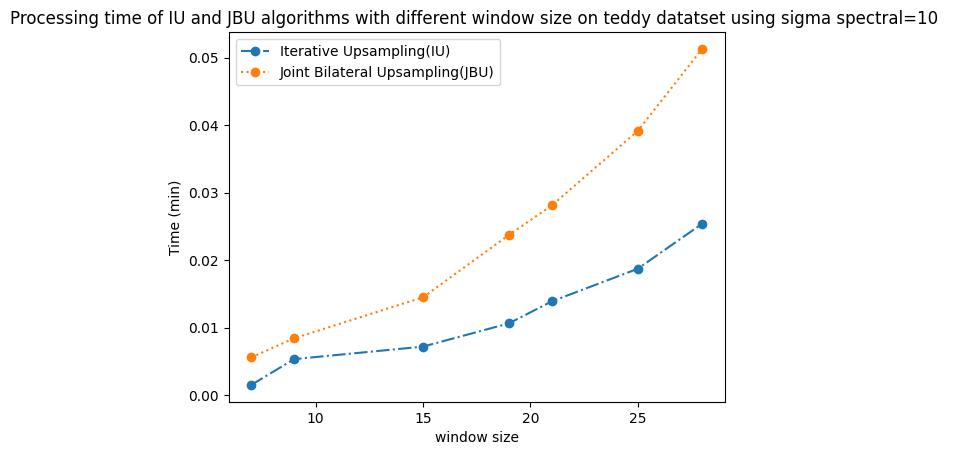

In [74]:
### teddy
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/time.csv",10,'teddy',[7,9,15,19,21,25,28],'sigma spectral','window size')


It can be seen in the below plots that the processing time in the IU and JBU approaches is almost not affected by changing sigma spectral.

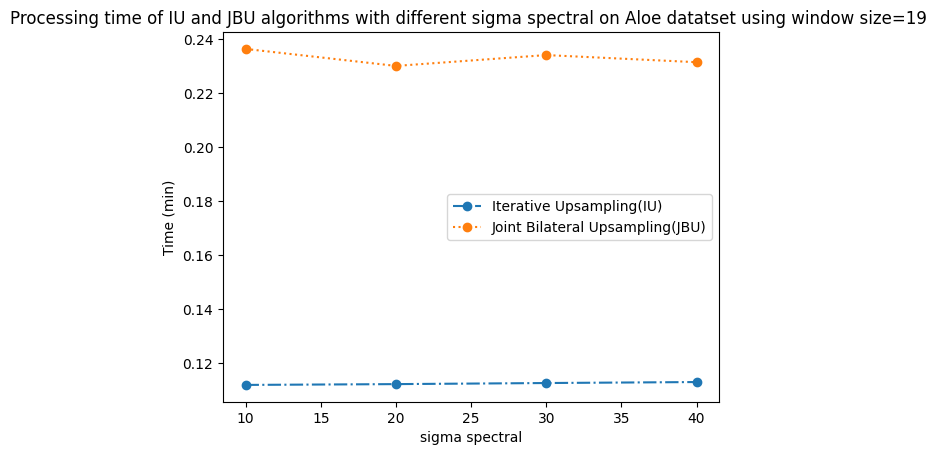

In [123]:
#### Aloe
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/time.csv",19,'Aloe',[  10,20,30,40],'window size','sigma spectral')

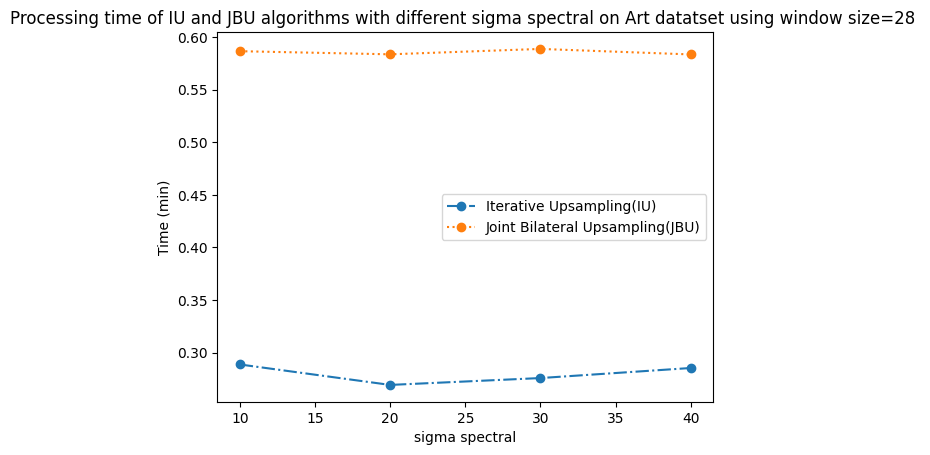

In [132]:
#### Art
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/time.csv",28,'Art',[10,20,30,40],'window size','sigma spectral')

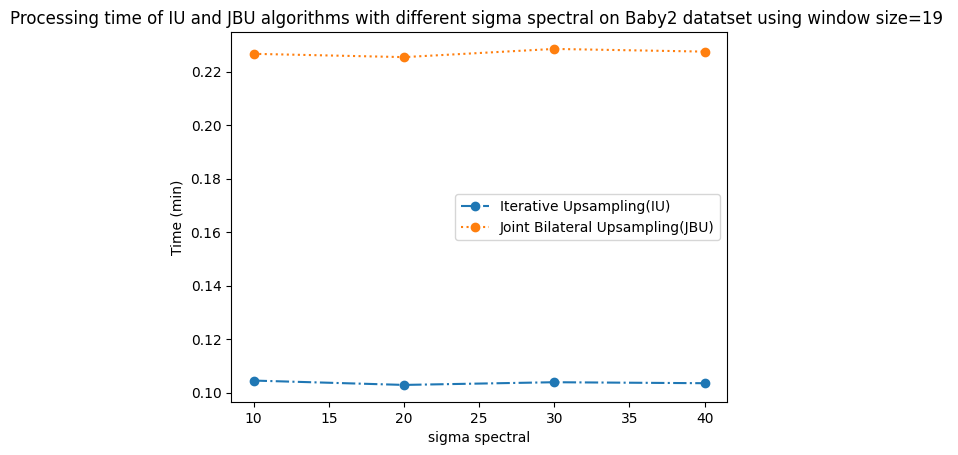

In [126]:
#### Baby2
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/time.csv",19,'Baby2',[ 10,20,30,40],'window size','sigma spectral')

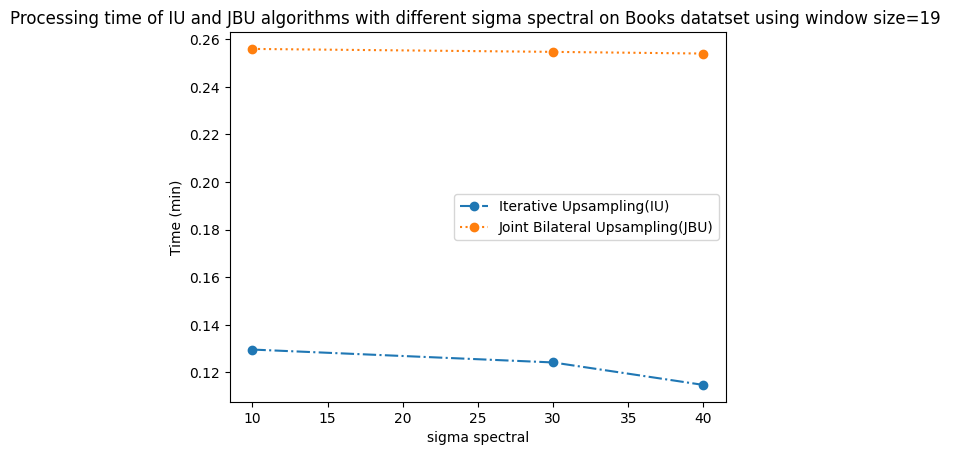

In [130]:
#### Books
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/time.csv",19,'Books',[ 10,30,40],'window size','sigma spectral')

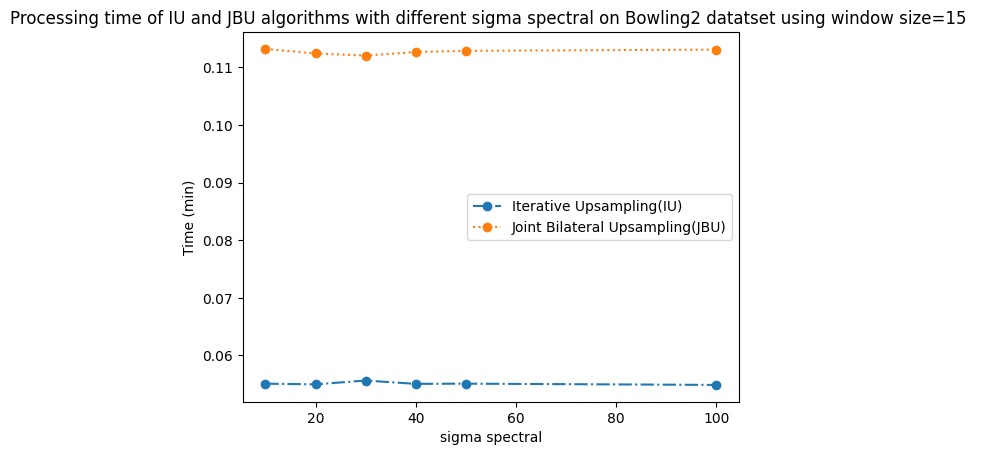

In [133]:
#### Bowling2
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/time.csv",15,'Bowling2',[ 10,20,30,40,50,100],'window size','sigma spectral')

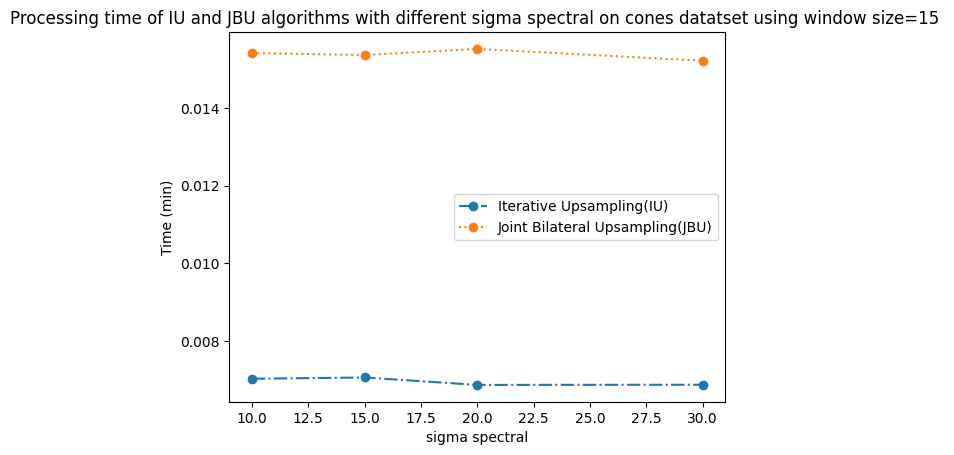

In [135]:
#### cones
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/time.csv",15,'cones',[ 10,15,20,30],'window size','sigma spectral')

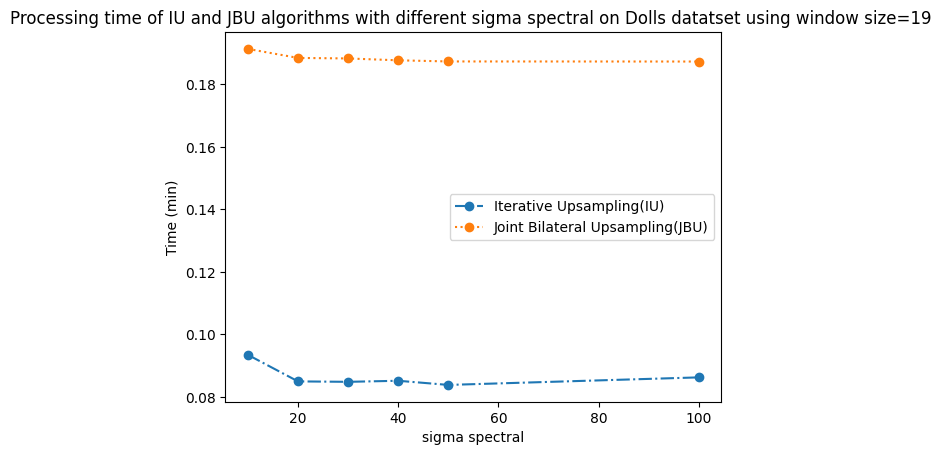

In [137]:
#### Dolls
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/time.csv",19,'Dolls',[  10,20,30,40,50,100],'window size','sigma spectral')

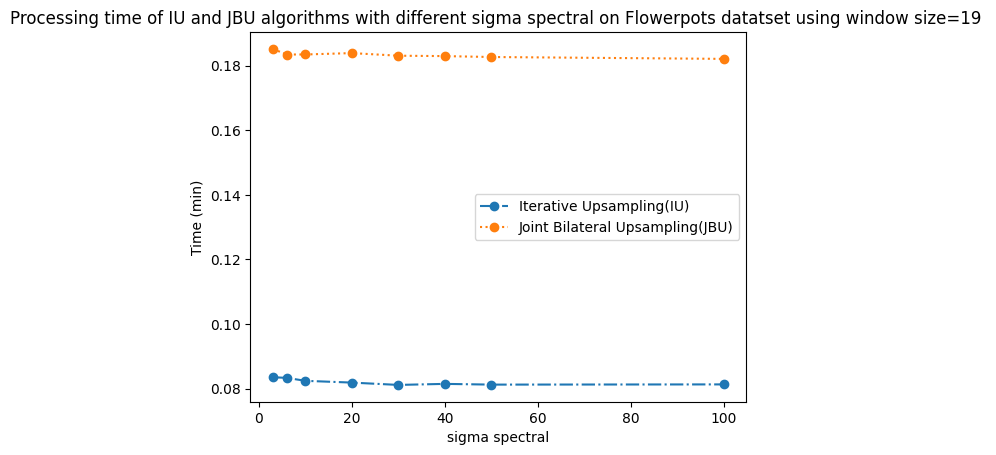

In [138]:
#### Flowerpots
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/time.csv",19,'Flowerpots',[ 3, 6, 10,20,30,40,50,100],'window size','sigma spectral')

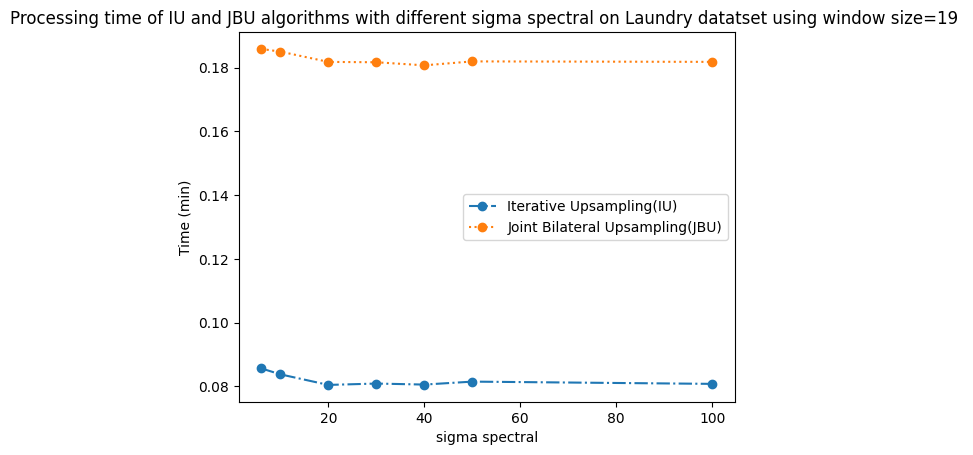

In [115]:
#### Laundry
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/time.csv",19,'Laundry',[ 6, 10,20,30,40,50,100],'window size','sigma spectral')

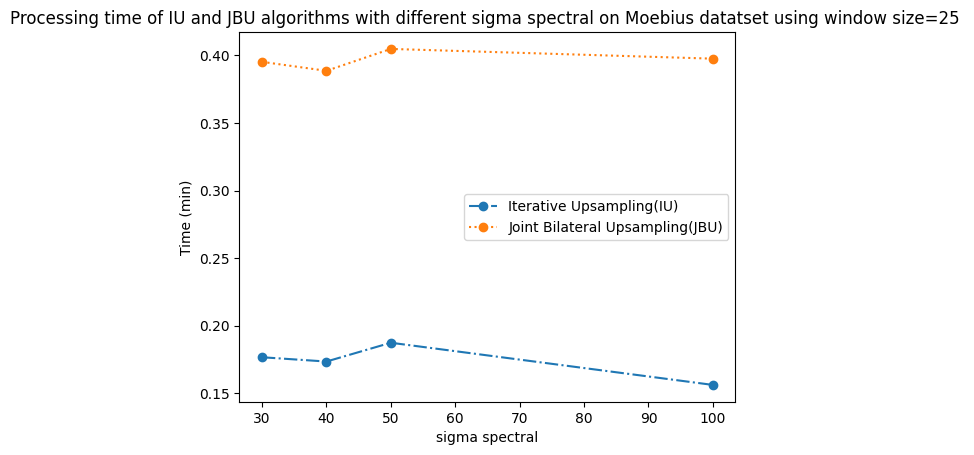

In [152]:
#### Moebius
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/time.csv",25,'Moebius',[ 30,40,50,100],'window size','sigma spectral')

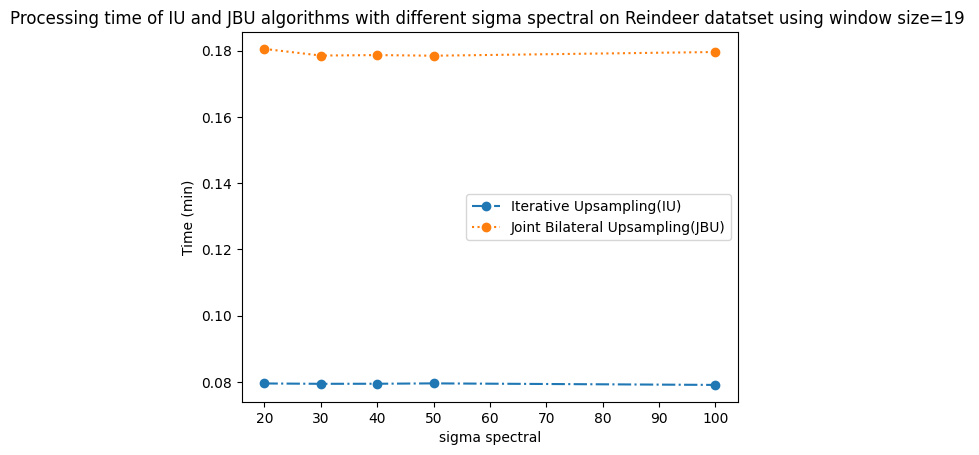

In [154]:
#### Reindeer
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/time.csv",19,'Reindeer',[ 20,30,40,50,100],'window size','sigma spectral')

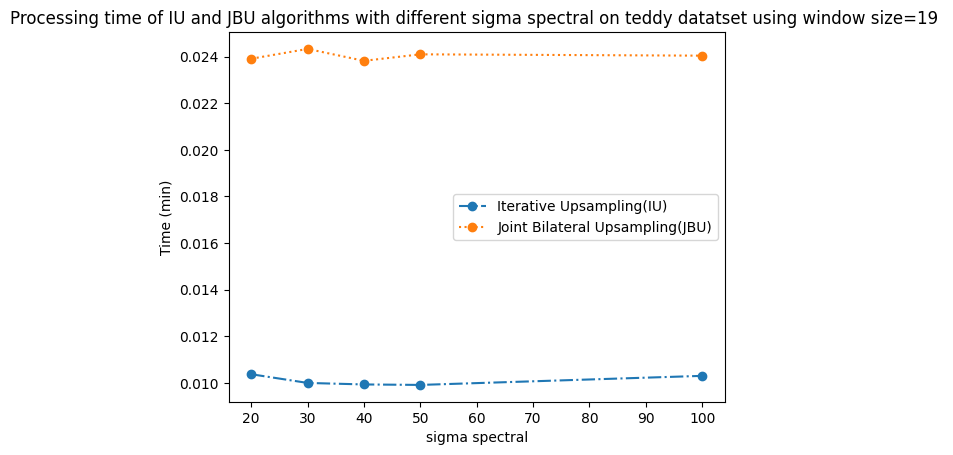

In [155]:
#### teddy
processing_time("/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/time.csv",19,'teddy',[ 20,30,40,50,100],'window size','sigma spectral')

# Point cloud, Oriented Point cloud and Triangulated Surface of the upsampled depth using Iterative upsampling approach.

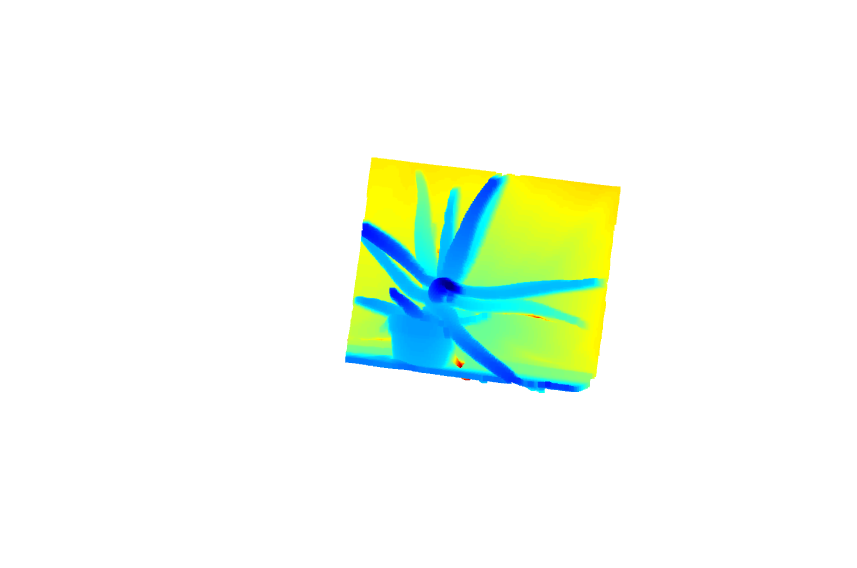

In [160]:
##Point Cloud from disparity map of Aleo dataset's pair generated usingIterativeUpsampling approach with w=9 sigma spectral=10
from IPython import display
##Flowerpots
display.Image("/home/rahaf/Pictures/Aloe_pc.png")


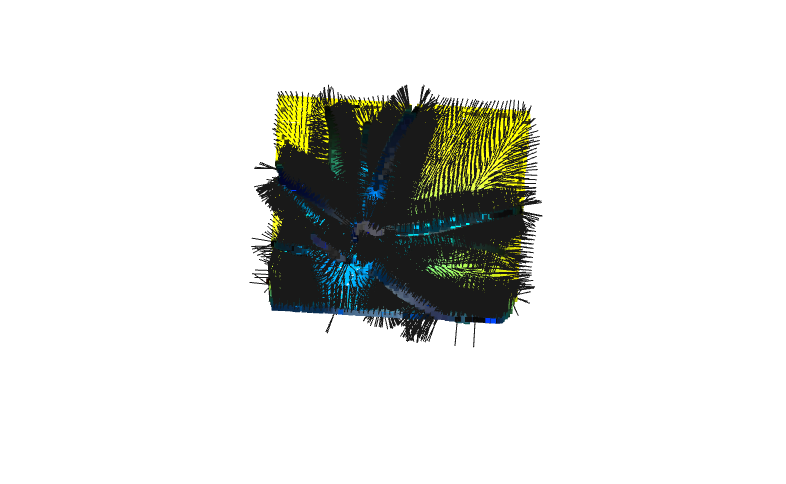

In [161]:
##Oriented Point Cloud from disparity map of Aleo dataset.
from IPython import display
##Flowerpots
display.Image("/home/rahaf/Pictures/Aloe_o.png")

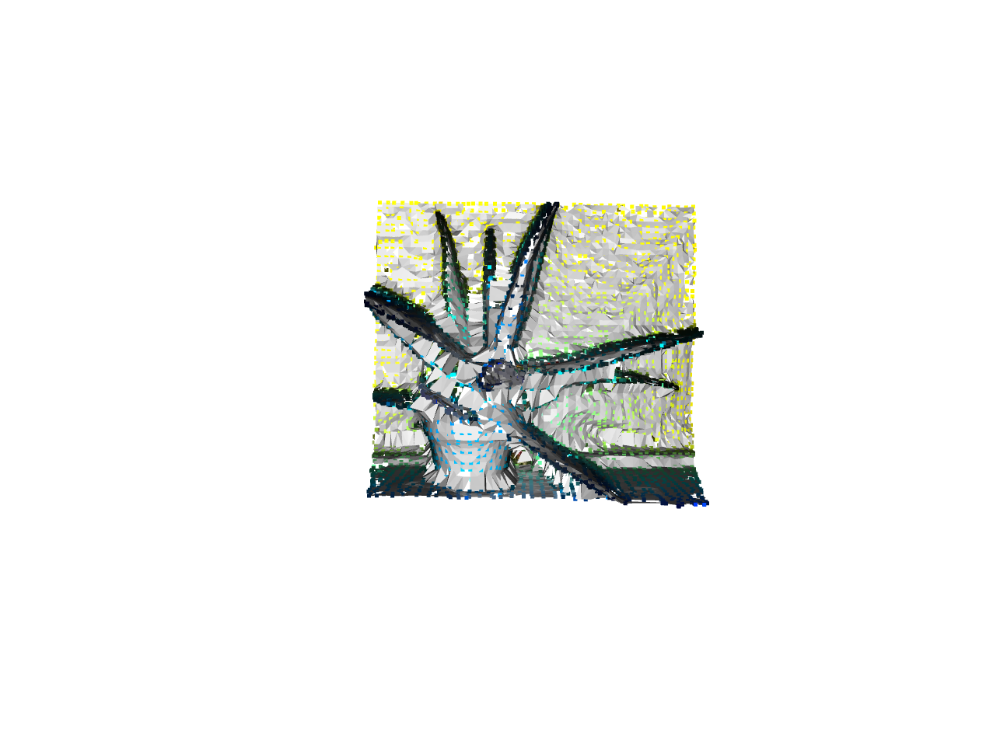

In [162]:
##Triangulated surface from Point Cloud from disparity map of Aleo dataset
from IPython import display
display.Image("/home/rahaf/Pictures/Aloe_3d.png")

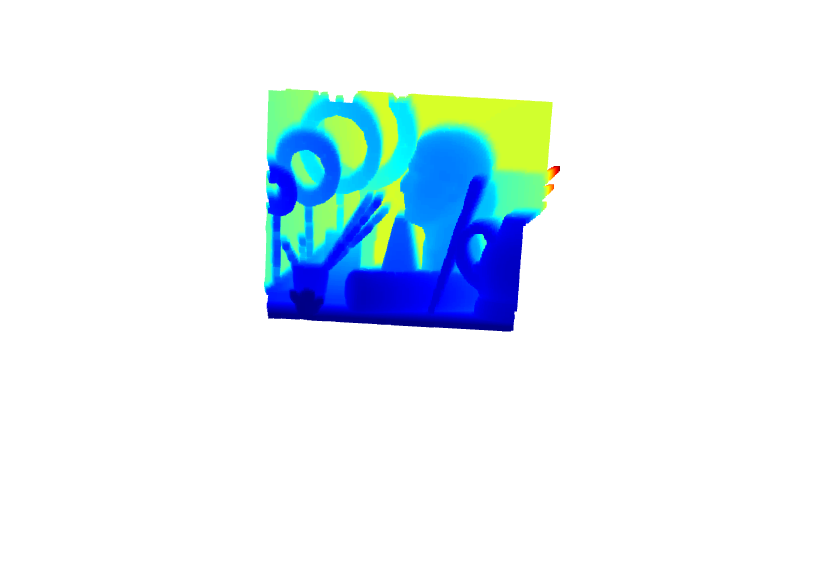

In [163]:
##Point Cloud from disparity map of Art dataset
from IPython import display
##Baby
display.Image("/home/rahaf/Pictures/Art_pc.png")

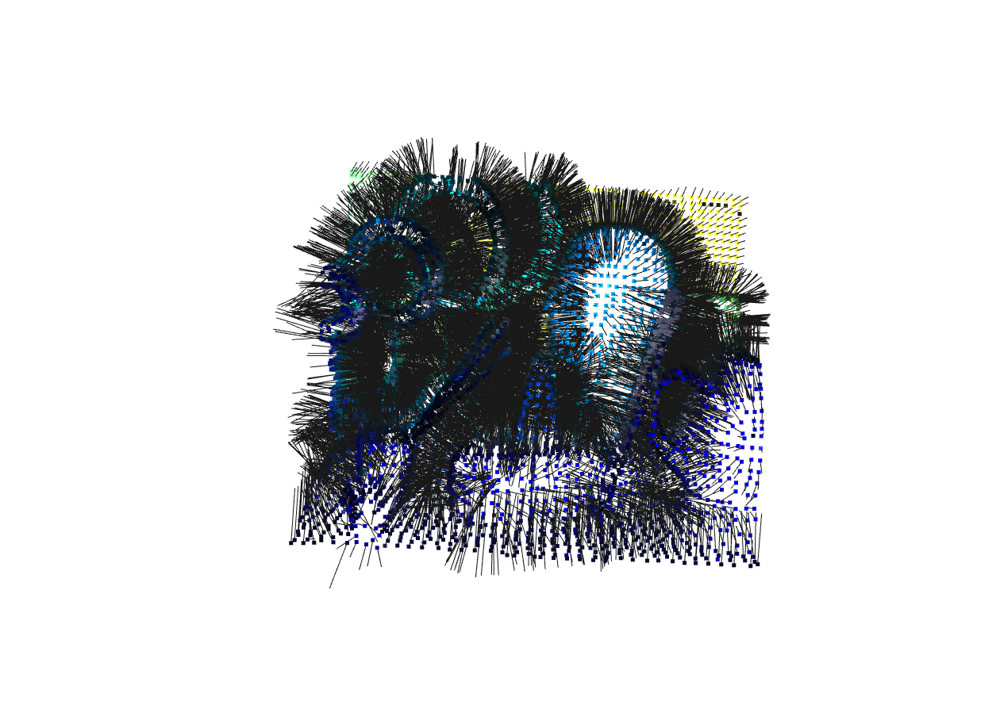

In [164]:
##Oriented Point Cloud from disparity map of Art dataset
from IPython import display
##Baby
display.Image("/home/rahaf/Pictures/Art_o.png")

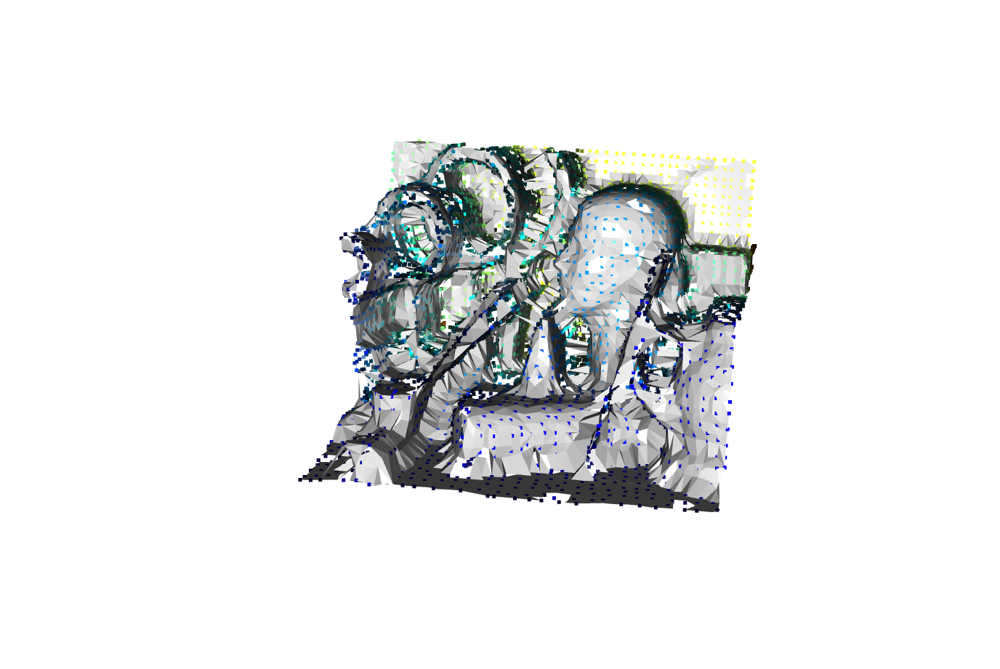

In [165]:
##Triangulated surface from Point Cloud from disparity map of Art dataset
from IPython import display
##Baby
display.Image("/home/rahaf/Pictures/Art_3d.png")

#  GUI for tuning parameters of the iterative upsampling filter.
As can be seen in the image of the terminal sigma spatial is adjusted accordingly to the window size since they are interdependent.

(-0.5, 1208.5, 591.5, -0.5)

/home/rahaf/.local/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


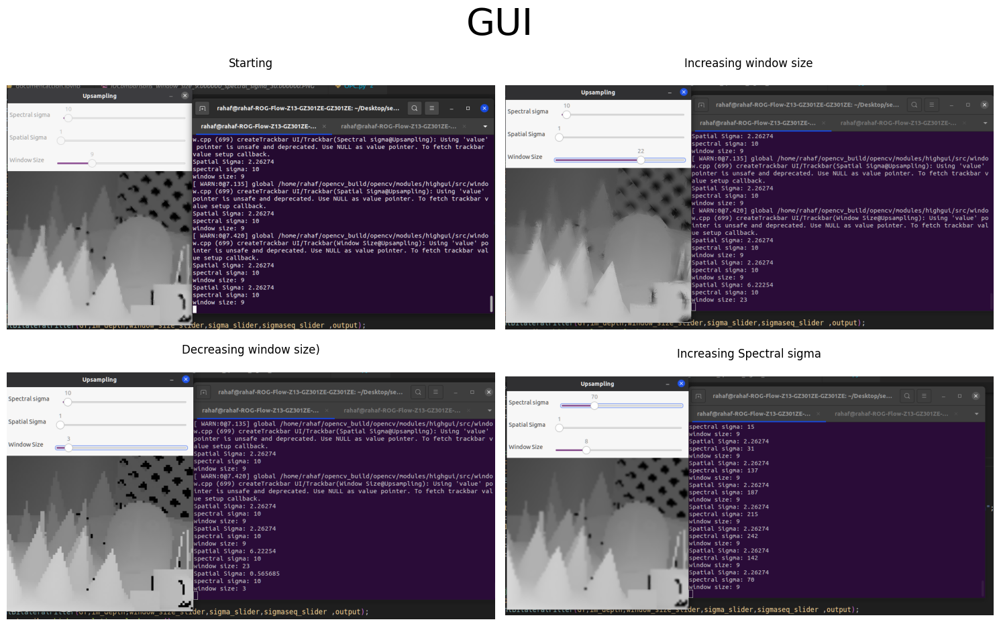

In [7]:
# show the output images

c1=cv2.imread("/home/rahaf/Pictures/c1.png")
c2=cv2.imread("/home/rahaf/Pictures/c2.png")
c3=cv2.imread("/home/rahaf/Pictures/c3.png")
c4=cv2.imread("/home/rahaf/Pictures/c4.png")

plt.suptitle("GUI",fontsize=40)

plt.rcParams["figure.figsize"] = [15,10]
plt.rcParams["figure.autolayout"] =     True

plt.subplot(2, 2, 1).set_title("Starting",pad=20)
plt.imshow(c1)
plt.axis("off")

plt.subplot(2, 2, 2).set_title( 'Increasing window size',pad=20)
plt.imshow(c2)
plt.axis("off")

plt.subplot(2, 2, 3).set_title( "Decreasing window size)",pad=20)
plt.imshow(c3)
plt.axis("off")

plt.subplot(2, 2, 4).set_title("Increasing Spectral sigma",pad=20)
plt.imshow(c4)
plt.axis("off")





# Optimal sigmas for the Iterative upsampling algorithm
Sigma spectral and spatial values were set to be equal (1, 3, 6, 10,15,20,30,40,50,100) and (1.97, 2.54, 4.24, 5.37, 5.94, 7.07, 7.92), respectively. The Iterative upsampling algorithm was then ran on all combinations, 70 in total, to determine the best sigmas.

In order to find the most similar result, I employed SSIM metrics. After finding the closest match, I compute the difference between it and the ground truth.

In [ ]:
from PIL import Image, ImageChops
def difference(gt,sol,sol2,dataset):
    gt=Image.open(gt).convert('RGB') 
    sol=Image.open(sol).convert('RGB')
    sol2=Image.open(sol2).convert('RGB')
    d=[]
    for i in [sol,sol2]:
        diff = ImageChops.difference(gt, i)
        RED = ('red')
        RL = Image.new('RGB', diff.size, RED) # Make a red layer the same size
        RedDiff = ImageChops.multiply(RL, diff) 
        d.append(RedDiff)



    # show the output images
    # plt.figure(facecolor='darkgrey')
    plt.suptitle("Difference Image ({} dataset)  ".format(dataset),fontsize=40)

    plt.rcParams["figure.figsize"] = [15,10]
    plt.rcParams["figure.autolayout"] =     True
    
    plt.subplot(2, 3, 1).set_title("High-resolution image",pad=20)
    plt.imshow(gt, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(2, 3, 2).set_title( 'Upsampled image using Joint Bilateral Upsampling',pad=20)
    plt.imshow(sol, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(2, 3, 3).set_title( "Difference Image (Red shows Difference between Images)",pad=20)
    plt.imshow(d[0])
    plt.axis("off")
    
    plt.subplot(2, 3, 4).set_title("High-resolution image",pad=20)
    plt.imshow(gt, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(2, 3, 5).set_title( 'Upsampled image using Iterative Upsampling Algorithm',pad=20)
    plt.imshow(sol2, cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(2, 3, 6).set_title( "Difference Image (Red shows Difference between Images)",pad=20)
    plt.imshow(d[1])
    plt.axis("off")



In [61]:
import os
from os import listdir
from skimage.metrics import structural_similarity as ssim
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math


def optimal(folder_dir,GT):
    GT=cv2.imread(GT,0)
    optimal=0
    for images in os.listdir(folder_dir):
        if (images.startswith("IUComparisons")):
            image = cv2.imread(os.path.join(folder_dir, images),0)


            (score, diff) = ssim(GT, image, full=True)

            if score>optimal:
                best=images
                optimal=score
    # print(best)
    ms= cv2.imread(os.path.join(folder_dir,best),0)
    sg=(best.split('sigma_')[1]).split('.PNG')[0]
    sg=round(float(sg),5)
    sigma=(best.split('window_size_')[1]).split('_spectral_sigma_')[0]
    sigma=round(math.sqrt(2.0) * (float(sigma)/2) / 2.5,3)
    plt.suptitle("optimal spectral sigma={} and spatial sigma={}".format(sigma,sg),fontsize=20)

    plt.rcParams["figure.figsize"] = [15,10]
    plt.rcParams["figure.autolayout"] =     True

    plt.subplot(1, 2, 1).set_title("Ground Truth",pad=20)
    plt.imshow(GT,cmap = plt.cm.gray)
    plt.axis("off")

    plt.subplot(1, 2, 2).set_title( 'Most Similar with score={} '.format(round(optimal,3)),pad=20)
    plt.imshow(ms,cmap = plt.cm.gray)
    plt.axis("off")





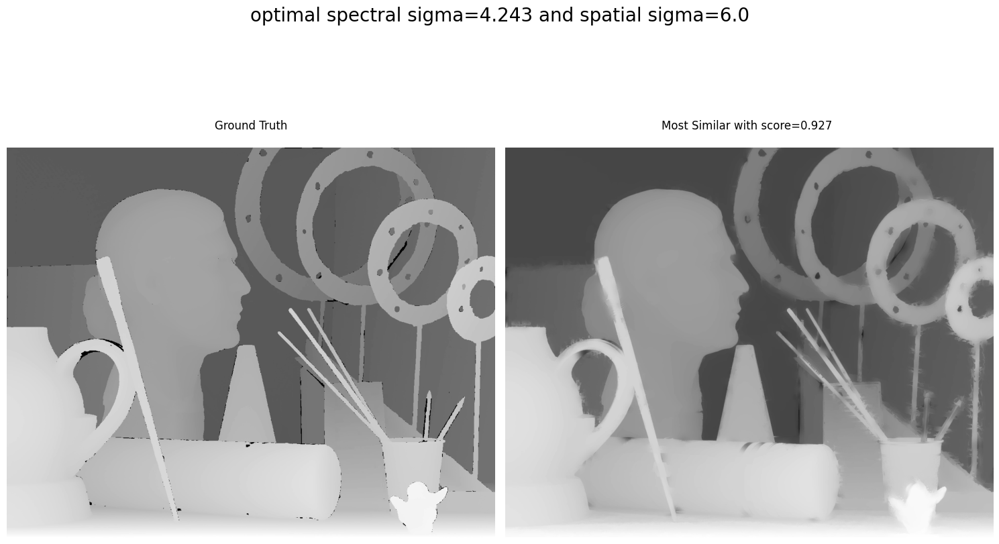

In [62]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png')

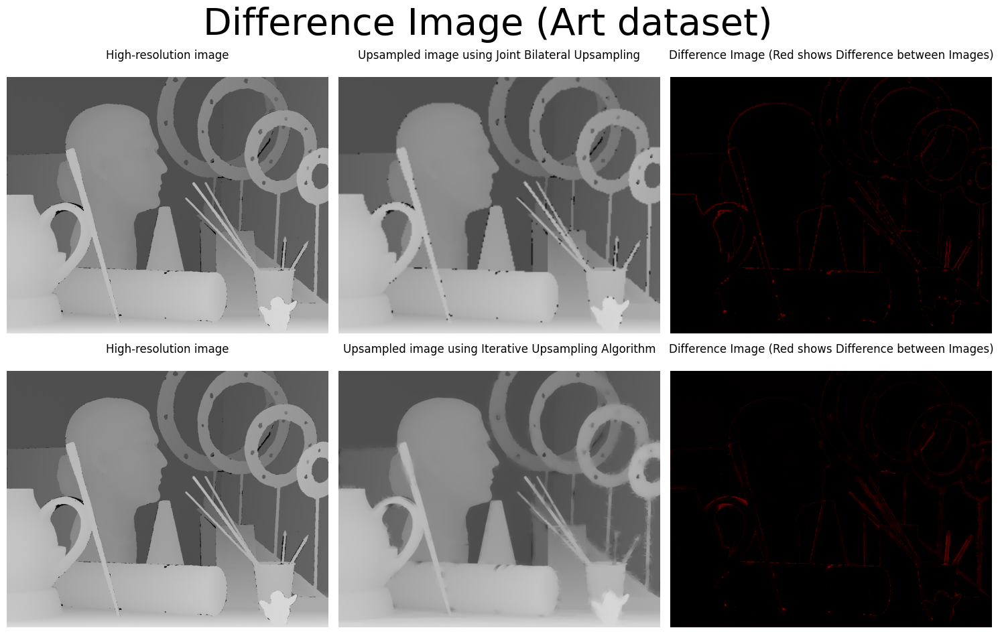

In [54]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Art/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Art/IUComparisons_window_size_15.000000_spectral_sigma_6.000000.PNG','Art')


IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG


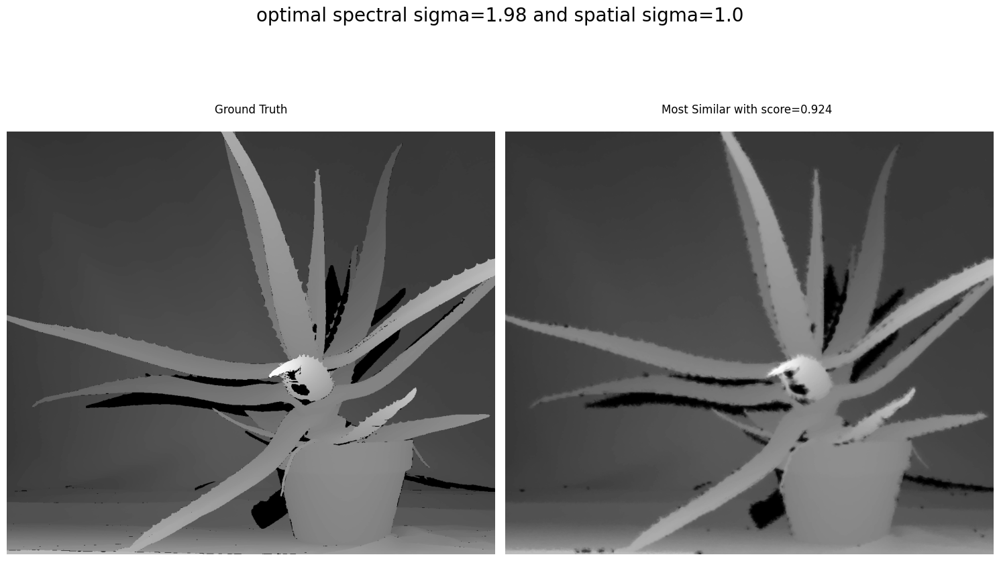

In [23]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png')

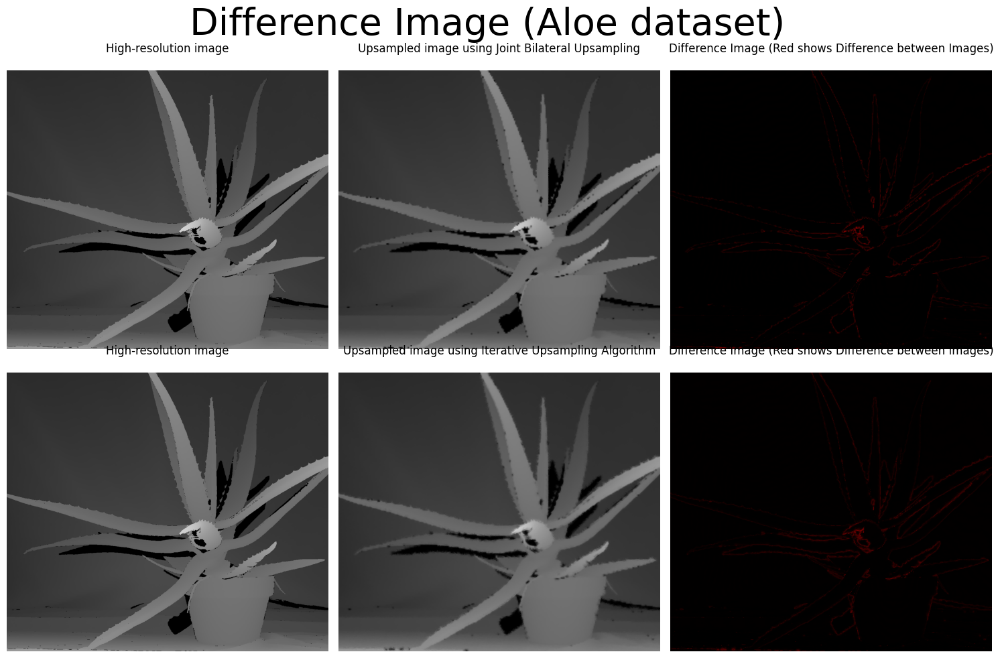

In [25]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Aloe/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Aloe/IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG','Aloe')


IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG


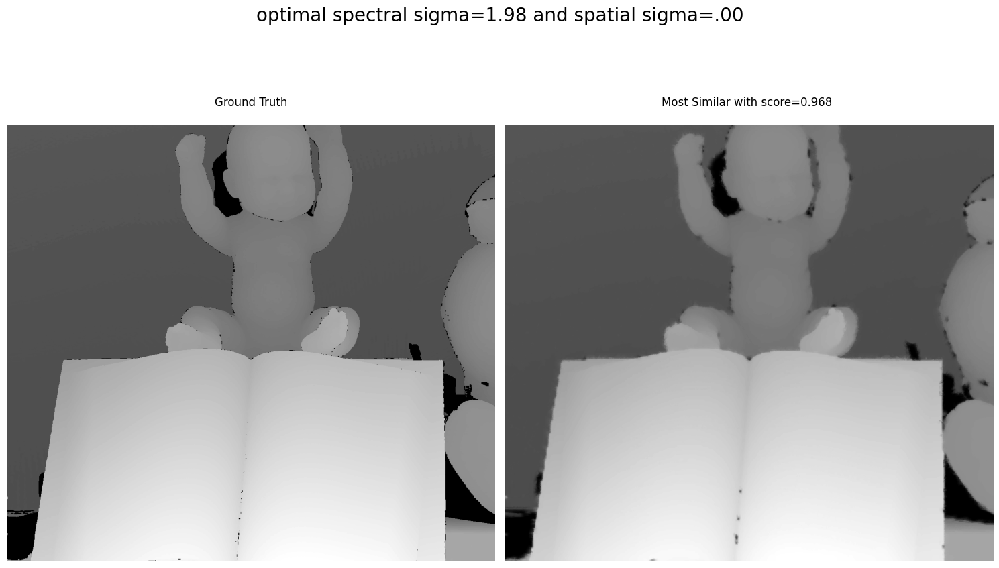

In [40]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png')

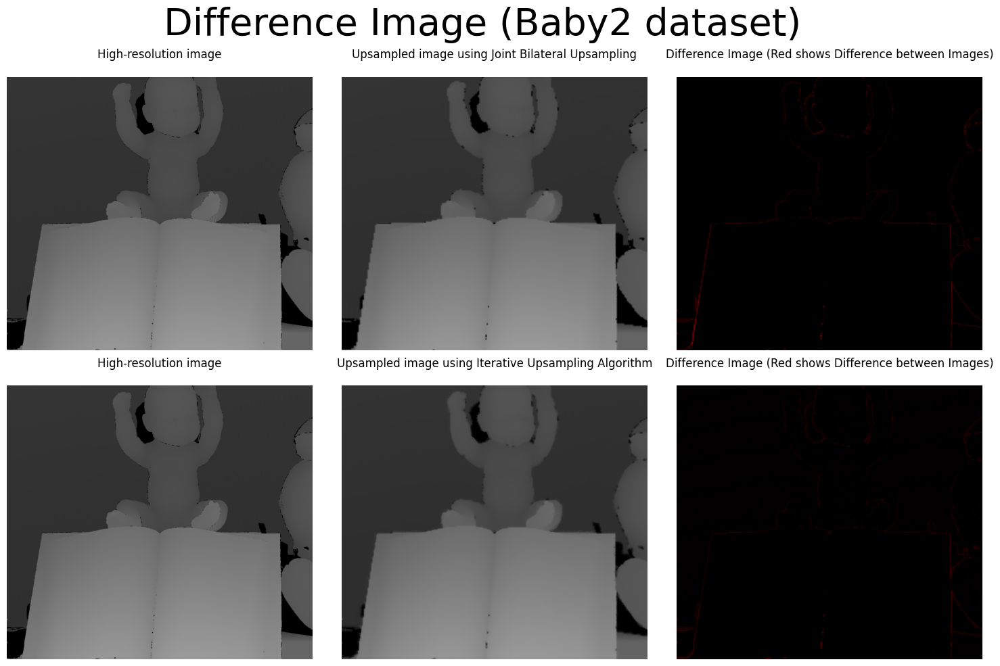

In [26]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Baby2/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Baby2/IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG','Baby2')


IUComparisons_window_size_9.000000_spectral_sigma_3.000000.PNG


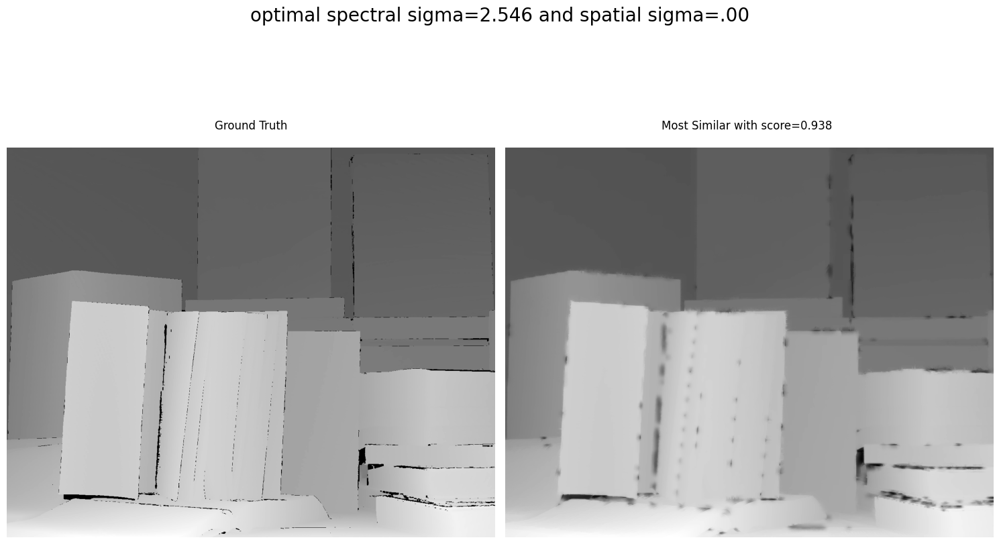

In [41]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png')

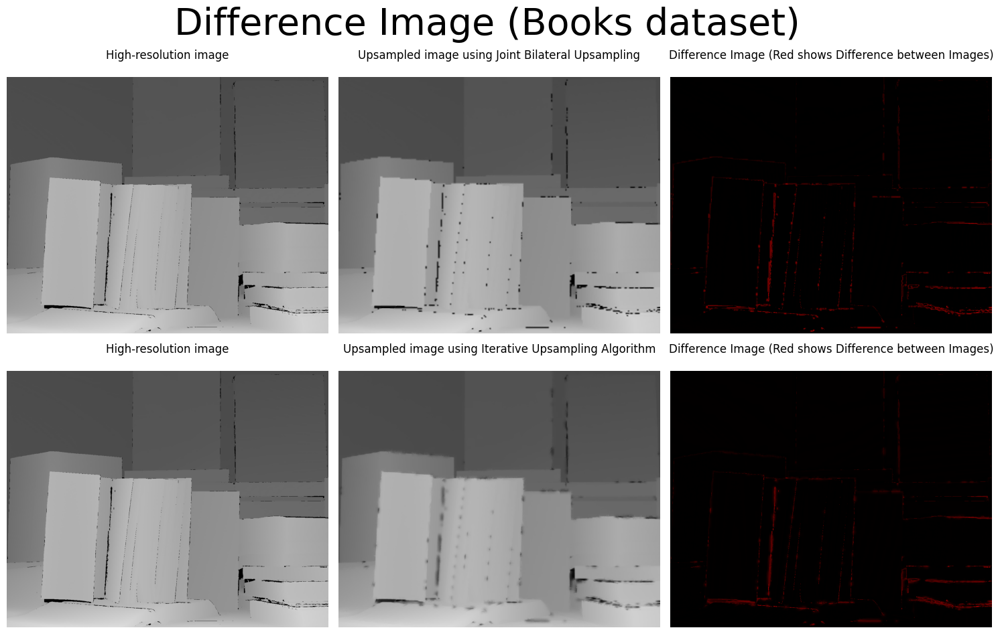

In [27]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Books/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Books/IUComparisons_window_size_9.000000_spectral_sigma_3.000000.PNG','Books')


IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG


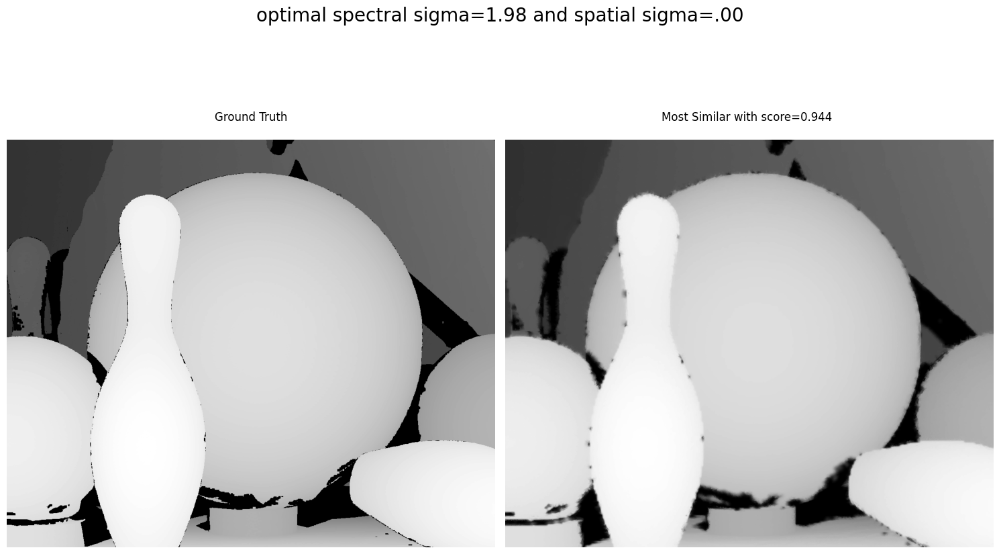

In [43]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png')

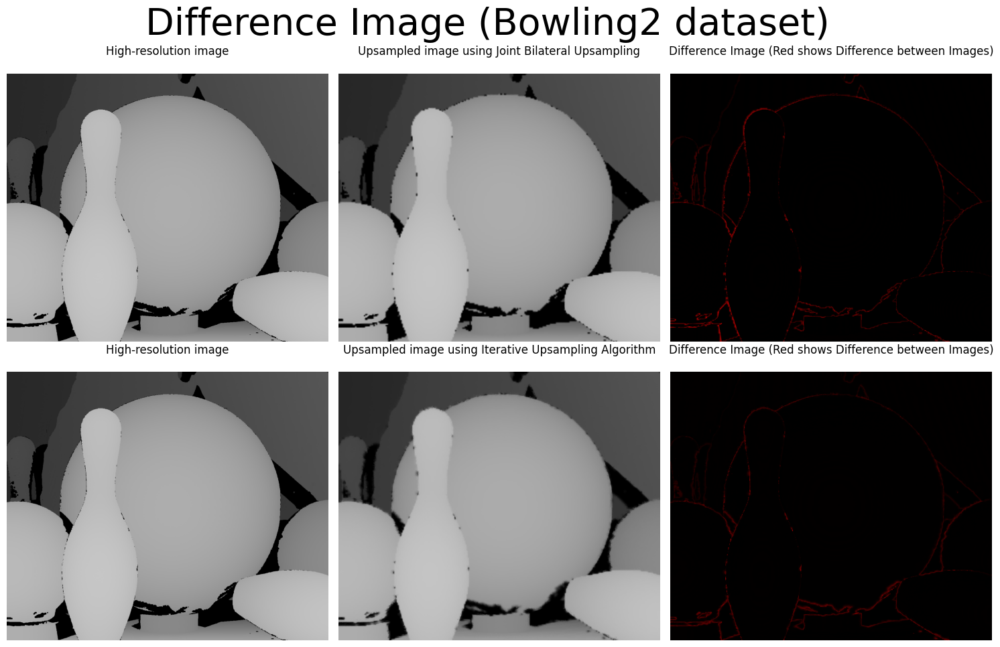

In [28]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Bowling2/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Bowling2/IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG','Bowling2')


IUComparisons_window_size_9.000000_spectral_sigma_3.000000.PNG


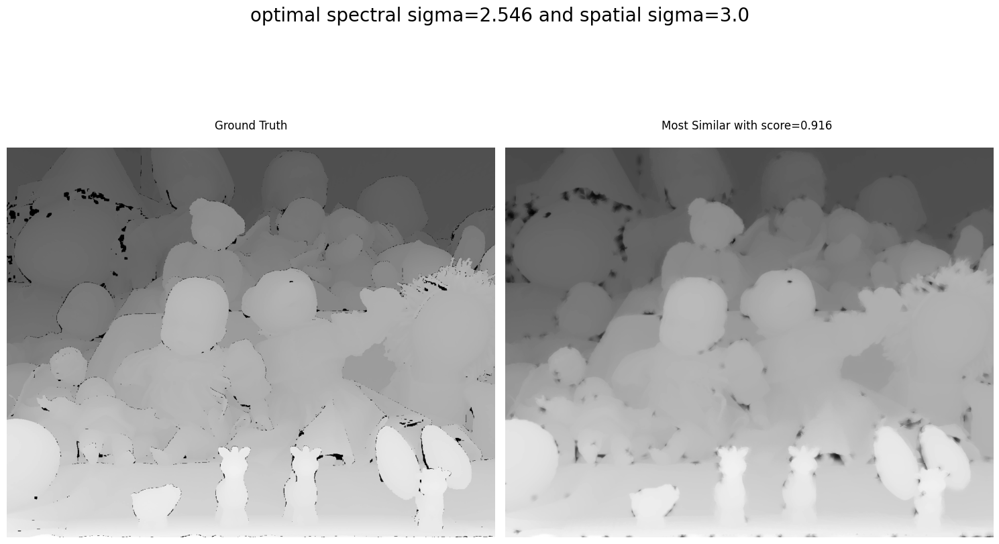

In [29]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png')

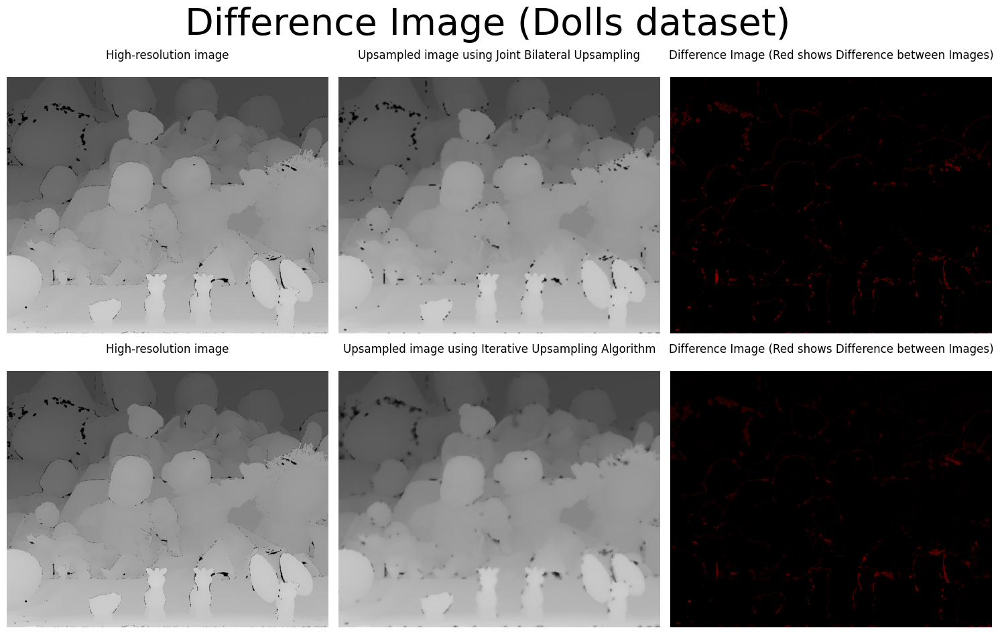

In [31]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Dolls/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Dolls/IUComparisons_window_size_9.000000_spectral_sigma_3.000000.PNG','Dolls')


IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG


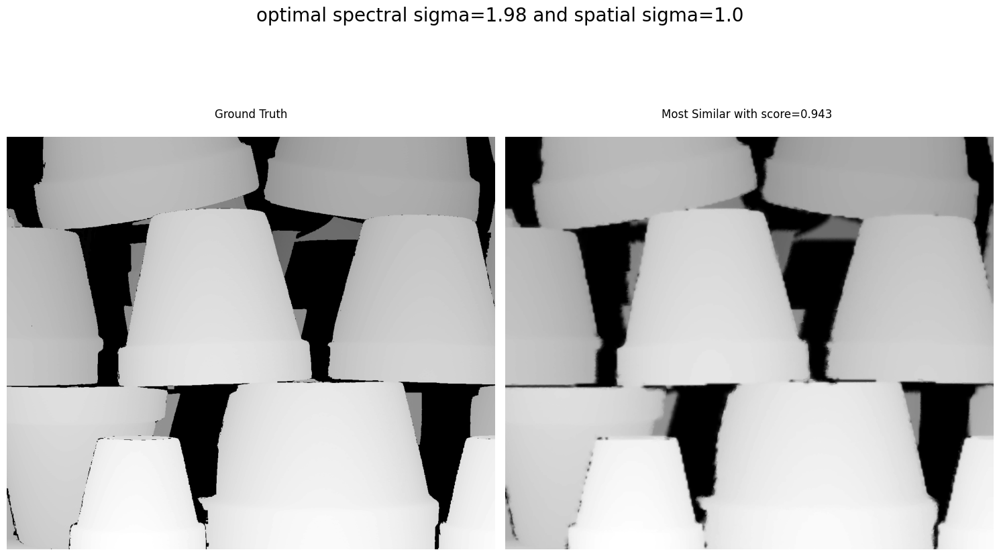

In [32]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png')

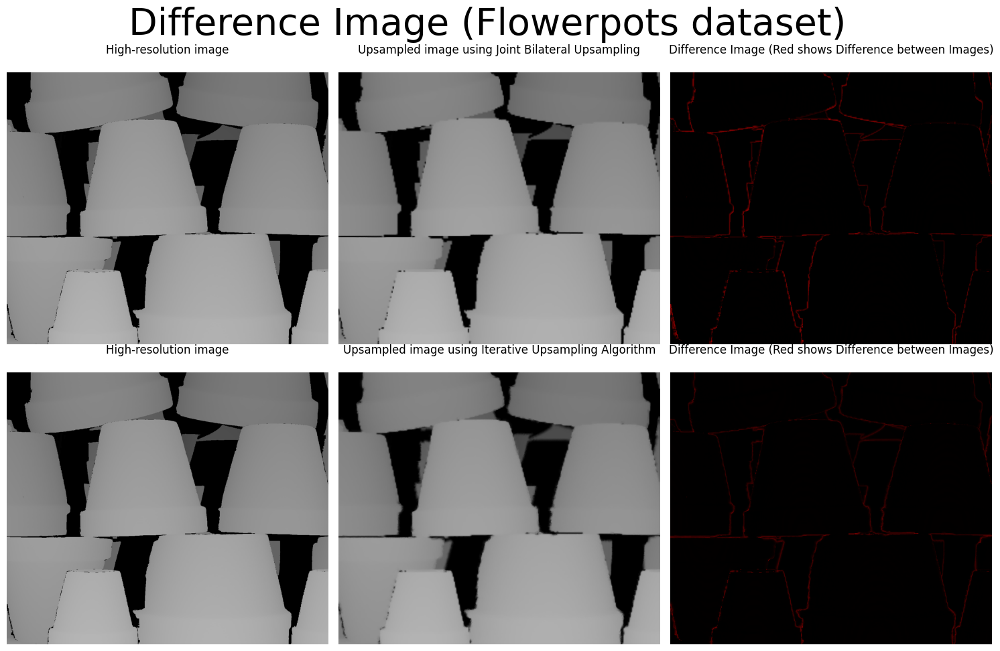

In [33]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Flowerpots/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Flowerpots/IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG','Flowerpots')


IUComparisons_window_size_9.000000_spectral_sigma_3.000000.PNG


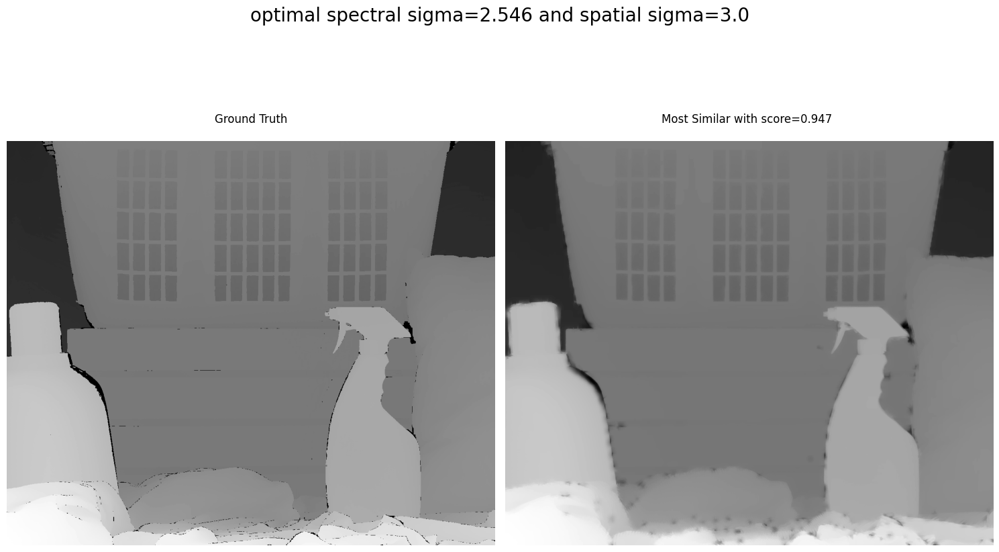

In [34]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png')

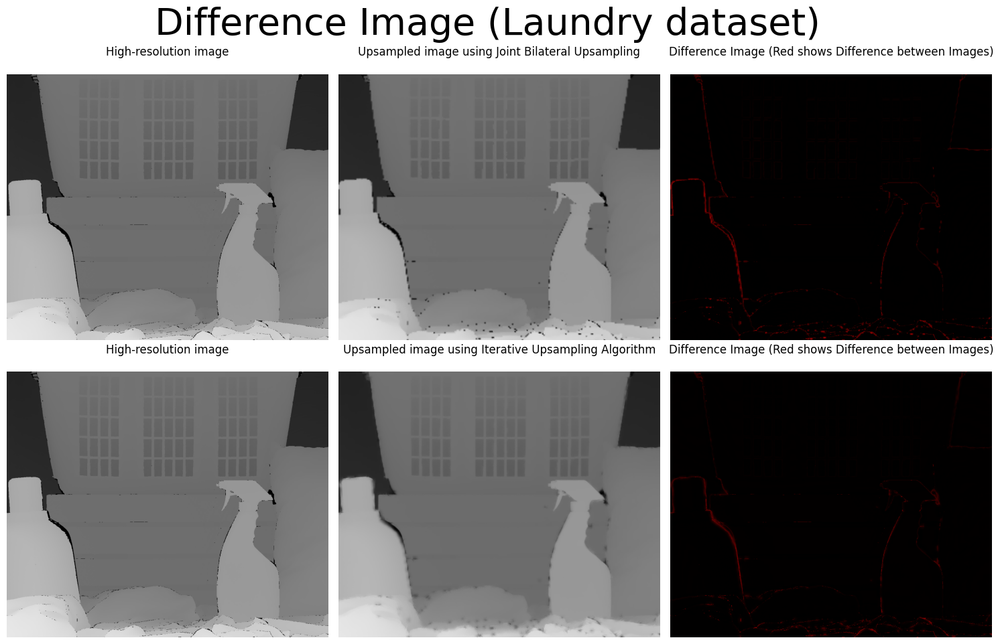

In [35]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Laundry/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Laundry/IUComparisons_window_size_9.000000_spectral_sigma_3.000000.PNG','Laundry')


IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG


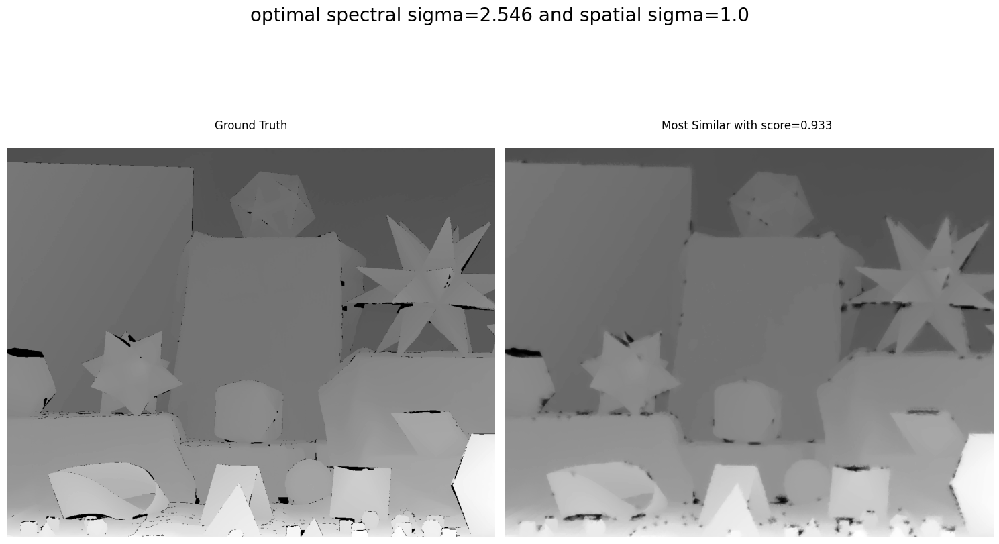

In [36]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png')

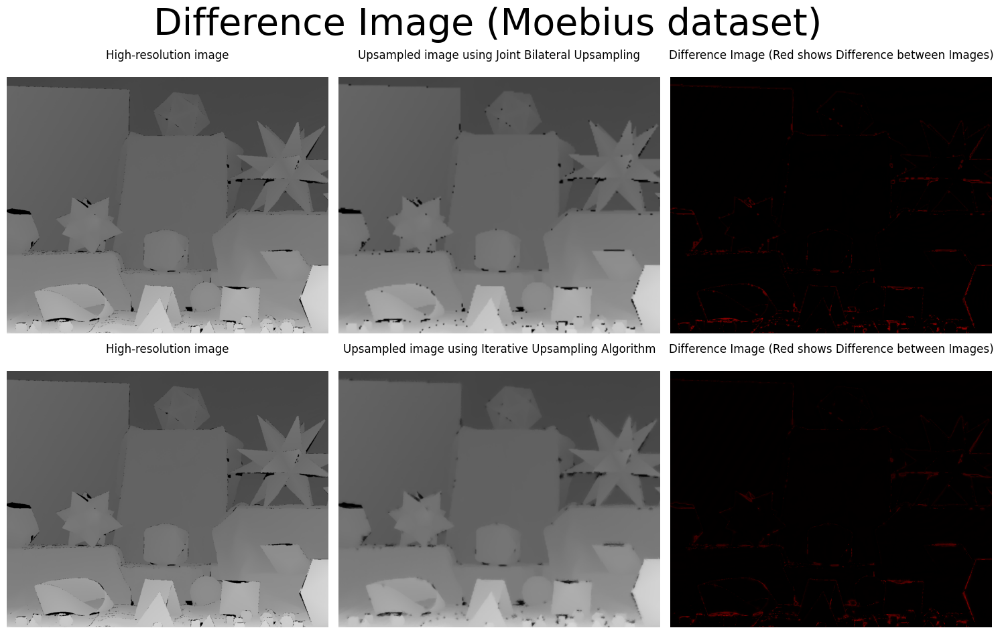

In [37]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Moebius/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Moebius/IUComparisons_window_size_9.000000_spectral_sigma_1.000000.PNG','Moebius')


IUComparisons_window_size_9.000000_spectral_sigma_6.000000.PNG


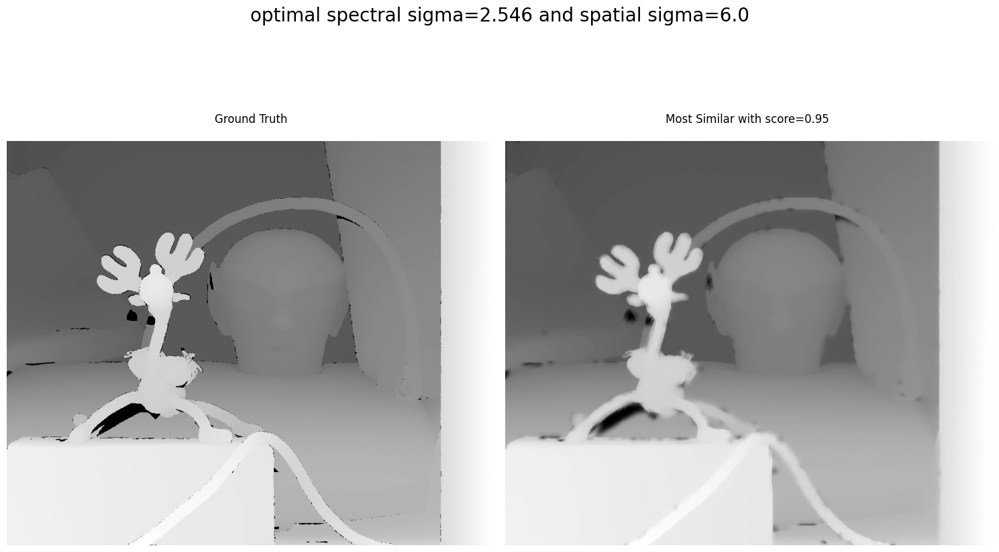

In [38]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png')

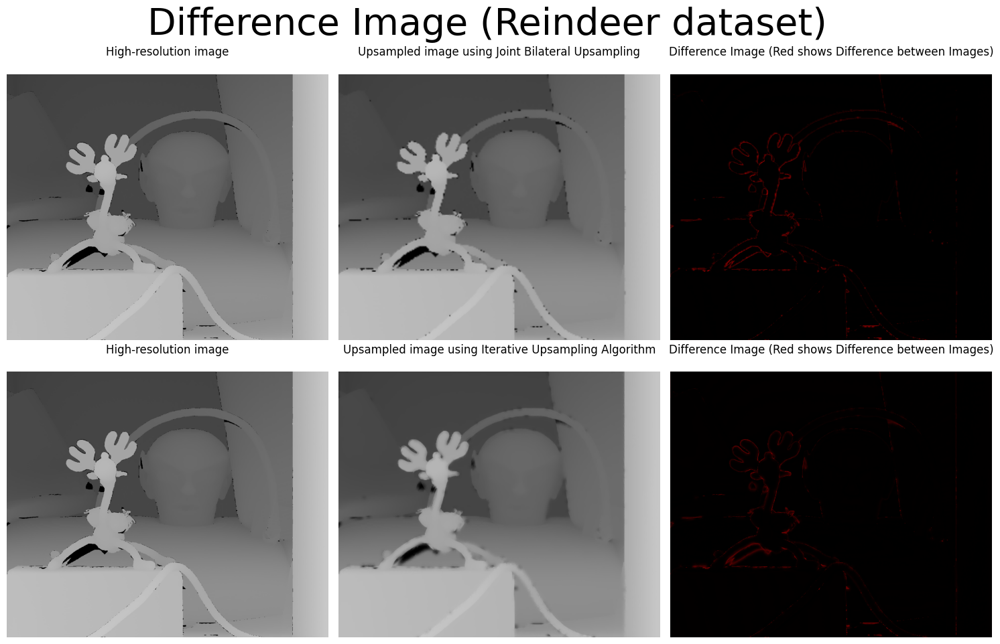

In [39]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/Reindeer/disp1.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/Reindeer/IUComparisons_window_size_9.000000_spectral_sigma_6.000000.PNG','Reindeer')


IUComparisons_window_size_9.000000_spectral_sigma_6.000000.PNG


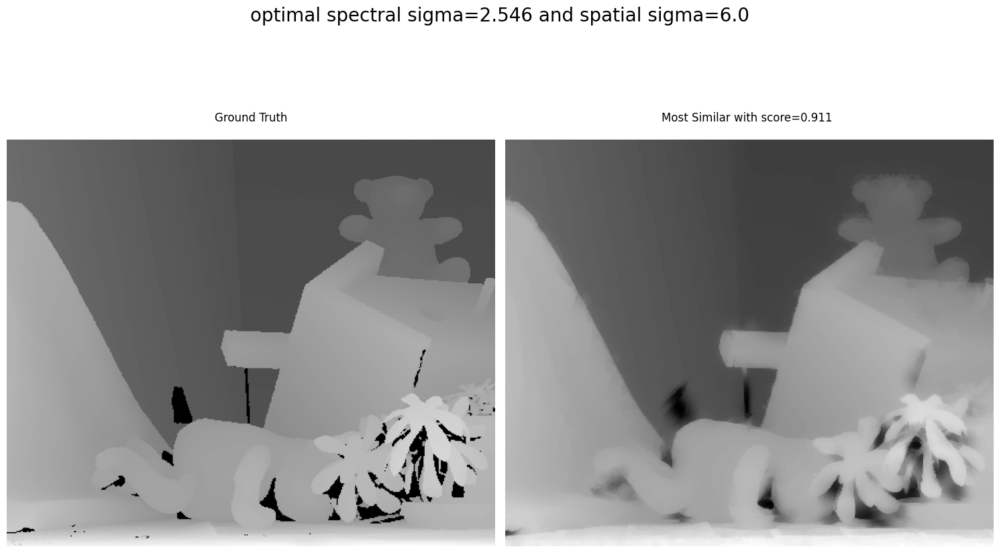

In [40]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/disp2.pgm')

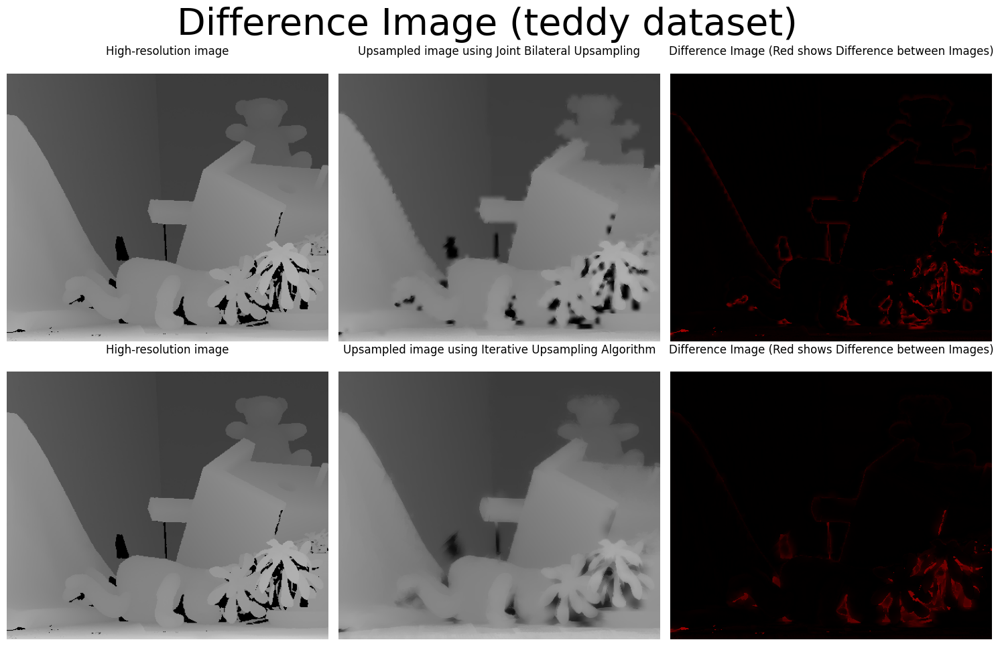

In [41]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/teddy/disp2.pgm','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/teddy/IUComparisons_window_size_9.000000_spectral_sigma_6.000000.PNG','teddy')


IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG


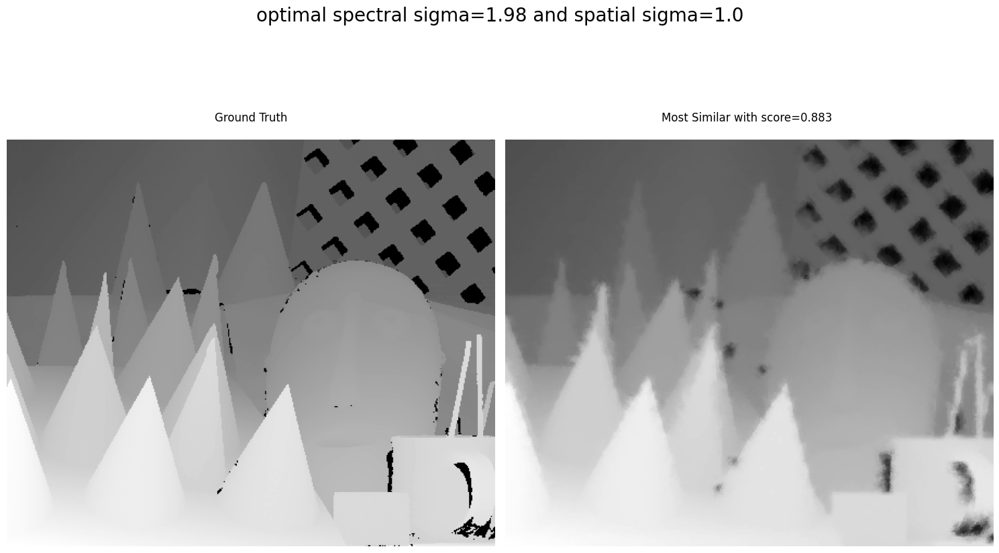

In [42]:
optimal( "/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/",'/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/disp2.pgm')

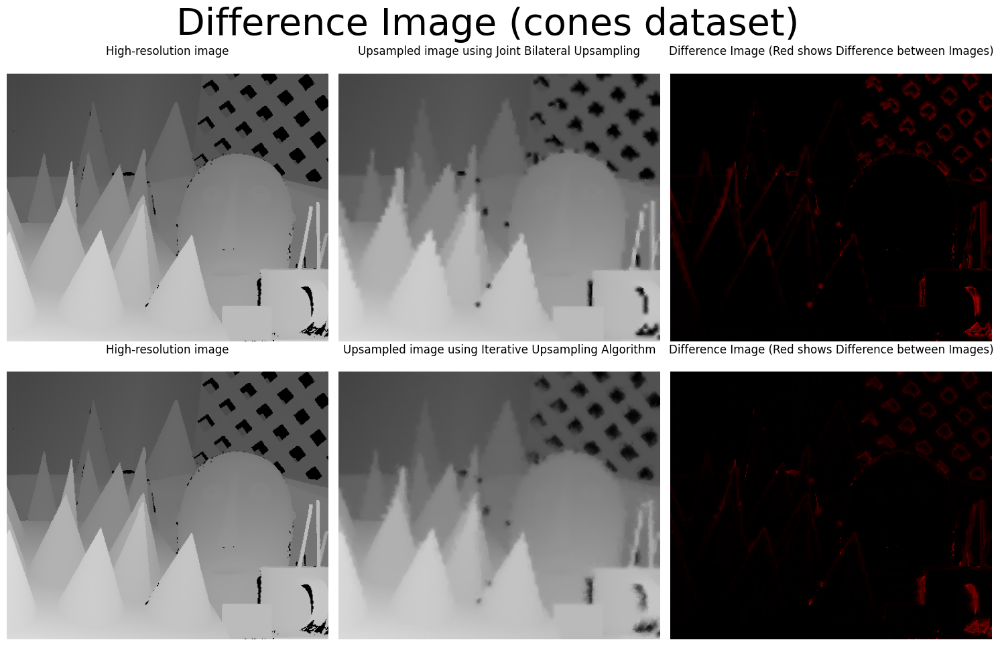

In [43]:
difference('/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/data/cones/disp2.pgm','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/JointBilateralUpsampling.png','/home/rahaf/Desktop/semester3/3DSSF_S3/lab2/02_opencv_filters/build/cones/IUComparisons_window_size_7.000000_spectral_sigma_1.000000.PNG','cones')
